<a href="https://colab.research.google.com/github/Payal2000/Data-Science-Assignments-INFO6105/blob/main/Breast_Cancer_Disease_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Breast Cancer Detection Disease**

## **Abstract**

The objective of this project is to diagnostically predict whether a patient is having breast cancer disease or not, based on certain diagnostic measurements included in the dataset.
The datasets consists of several medical predictor variables and one target variable, Class(**diagnosis**).

## **Aim:**
In this assignment we aim to develop a complete ML project with

- Checking Data Quality by performing different EDA techniques
- Feature Selection
- Modeling - Training Models, Selecting Best Model, Hyperparameter Tuning
- Model Interpretibility
- Reports and Visualizations

## **Column Description for our Dataset**


- **id:** Unique identifier for each patient or observation.
- **diagnosis:** The diagnosis of breast tissues.
 - M: Malignant - Indicates cancerous tumors.
 - B: Benign - Indicates non-cancerous tumors.
- **radius_mean:** Mean of distances from the center to points on the perimeter of the tumor.
- **texture_mean:** Standard deviation of gray-scale values, which can give an indication of the texture or smoothness of the tumor.
- **perimeter_mean:** Mean size of the core tumor.
- **area_mean:** Mean area covered by the tumor.
- **smoothness_mean:** Mean of the local variation in radius lengths.
- **compactness_mean:** Mean of the perimeter^2 / area - 1.0.
- **concavity_mean:** Mean of the severity of concave portions of the contour of the tumor.
- **concave points_mean:** Mean number of concave portions of the contour.
- **symmetry_mean:** Mean symmetry of the tumor.
- **fractal_dimension_mean:** It gives an indication of how the shape of the tumor deviates from a simple shape.





### **Kaggle Dataset Link:**  https://www.kaggle.com/datasets/yasserh/breast-cancer-dataset



## **Target Variable/Dependent Variable**
The datasets consists of several medical predictor variables and one target variable, **diagnosis** with classes such as M (malignant) or B (benign)

**Predictor variables includes** : All variables except for the diagnosis are predictor variables.



In [1]:
#Loading the required libraries
import numpy as np
import matplotlib as mlt
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import statsmodels.api as sd
from sklearn import tree
import sklearn.metrics as sm
import warnings
warnings.filterwarnings("ignore")

In [68]:
##Installing all the required libraries for the Assignment
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o
!pip install fitter

import csv
import json
import logging
import optparse
import os
import random
import sys
import time
from datetime import datetime
from distutils.util import strtobool


import h2o
import matplotlib.pylab as plt
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import psutil
import seaborn as sns
from fitter import Fitter, get_common_distributions, get_distributions
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.estimators.random_forest import H2ORandomForestEstimator
from h2o.grid.grid_search import H2OGridSearch
from matplotlib.pyplot import figure

sns.set(rc={"figure.figsize": (16, 8)})

# Data Imputation
!pip install fancyimpute
from fancyimpute import IterativeImputer as MICE

# Model Interpretation
!pip install shap
import shap
from sklearn.model_selection import train_test_split

1. What is the question?

2. What did you do?

3. How well did it work?

4. What did you learn?

# What question are you trying to answer? How did you frame it as an ML task?

- The objective here is to diagnostically predict whether a patient is having **Breast Cancer disease** or not, based on certain diagnostic measurements included in the dataset.
- Since the target variable **diagnosis** is binary with only two values ('M' or 'B'), we can train a binary classification model using supervised learning algorithms such as logistic regression, decision trees, random forests, or support vector machines.
- **Breast Cancer Disease** is a classification problem because it involves categorizing individuals based on the stage and severity of their disease.
- It is a progressive condition that can develop slowly over time, often with few or no symptoms until the disease is advanced.
- In my case, the model is being trained to learn patterns and relationships between various medical parameters.
- Once the model is trained on certain portion of data it can be used to make predictions on new data, where it takes in the different medical parameters for an individual and outputs a prediction of whether or not they have the disease.



# What is human-level performance on that task? What level of performance is needed?
-  Generally, a clinician with experience in diagnosing Breast Cancer Disease can achieve high accuracy in predicting the disease, often exceeding 90% accuracy in many cases.
- The level of performance needed for Breast Cancer disease prediction using ML algorithms may vary depending on the specific application and use case of the model. If the model is able to predict the true positive predictions and false predictions, false predictions will mislead the person of assuming is not prone to disease  
- A well-designed and validated ML model that achieves high accuracy in predicting Breast Cancer Disease would be considered beneficial for improving patient outcomes and reducing healthcare costs.

In [2]:
#Reading file
#file_url = "https://raw.githubusercontent.com/Payal2000/Data-Science-Assignments-INFO6105/main/new_model.csv"
data = pd.read_csv(r"https://raw.githubusercontent.com/Payal2000/Data-Science-Assignments-INFO6105/main/new_model.csv")

## **Where did the feature data and label come from?**
- Breast cancer is the most common cancer amongst women in the world. It accounts for 25% of all cancer cases, and affected over 2.1 Million people in 2015 alone.
- It starts when cells in the breast begin to grow out of control.
- These cells usually form tumors that can be seen via X-ray or felt as lumps in the breast area.

**There are total 31 features**

 - 0   id                       
 - 1   diagnosis               
 - 2   radius_mean              
 - 3   texture_mean             
 - 4   perimeter_mean           
 - 5   area_mean                
 - 6   smoothness_mean          
 - 7   compactness_mean        
 - 8   concavity_mean           
 - 9   concave points_mean      
 - 10  symmetry_mean           
 - 11  fractal_dimension_mean   
 - 12  radius_se                
 - 13  texture_se               
 - 14  perimeter_se             
 - 15  area_se                  
 - 16  smoothness_se            
 - 17  compactness_se           
 - 18  concavity_se             
 - 19  concave points_se        
 - 20  symmetry_se              
 - 21  fractal_dimension_se     
 - 22  radius_worst             
 - 23  texture_worst            
 - 24  perimeter_worst         
 - 25  area_worst              
 - 26  smoothness_worst         
 - 27  compactness_worst       
 - 28  concavity_worst          
 - 29  concave points_worst     
 - 30  symmetry_worst           
 - 31  fractal_dimension_worst  



# Performing Exploratory Data Analysis

In [6]:
##Reading first 30 rows
data.head(30)


,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.990,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.71190,0.26540,0.4601,0.11890
1,842517,M,20.570,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.24160,0.18600,0.2750,0.08902
2,84300903,M,19.690,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.45040,0.24300,0.3613,0.08758
3,84348301,M,11.420,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.68690,0.25750,0.6638,0.17300
4,84358402,M,20.290,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.40000,0.16250,0.2364,0.07678
5,843786,M,12.450,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.53550,0.17410,0.3985,0.12440
6,844359,M,18.250,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,...,22.88,27.66,153.20,1606.0,0.1442,0.2576,0.37840,0.19320,0.3063,0.08368
7,84458202,M,13.710,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.05985,...,17.06,28.14,110.60,897.0,0.1654,0.3682,0.26780,0.15560,0.3196,0.11510
8,844981,M,13.000,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.09353,...,15.49,30.73,106.20,739.3,0.1703,0.5401,0.53900,0.20600,0.4378,0.10720
9,84501001,M,12.460,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,...,15.09,40.68,97.65,711.4,0.1853,1.0580,1.10500,0.22100,0.4366,0.20750


In [4]:
# Checking Data Type of each variable
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [ ]:
#Checking missing values in our data
data.isnull().sum()

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

### Observations:
- We have 0% missing values both in our independent variables as well as dependent variable

Text(0, 0.5, 'Diagnosis')

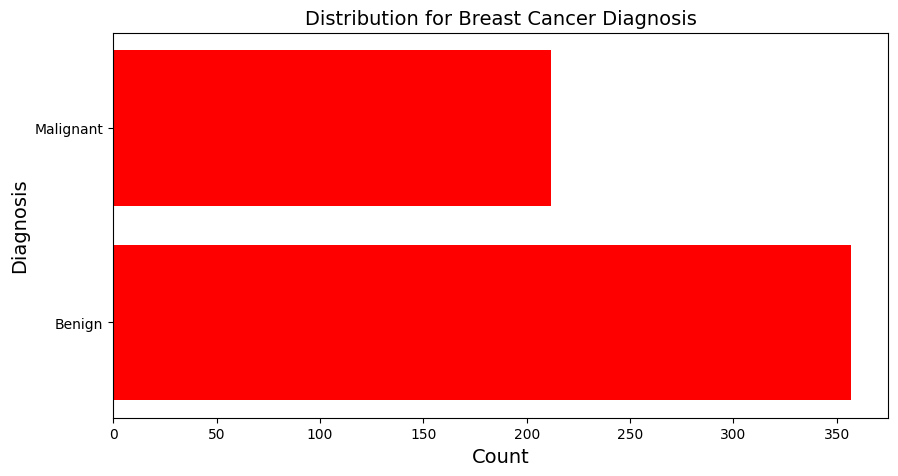

In [7]:
#Checking if diagnosis has only M and B (binary)
data['diagnosis'].value_counts()

#Plotting the distribution for Diagnosis
plt.figure(figsize=(10,5))
plt.barh(['Benign', 'Malignant'], data['diagnosis'].value_counts(), color ="#FF0000")
plt.title('Distribution for Breast Cancer Diagnosis', size =14)
plt.xlabel("Count", size =14)
plt.ylabel("Diagnosis", size =14)

**This type of chart is commonly used in medical data analysis to visualize the distribution of different diagnoses**

- It features two categories on the y-axis: "Malignant" and "Benign". The x-axis is labeled "Count" and shows a numerical range.
- There are two bars corresponding to each category. The bar for "Malignant" is shorter than the bar for "Benign", indicating a lower count for malignant cases compared to benign cases.

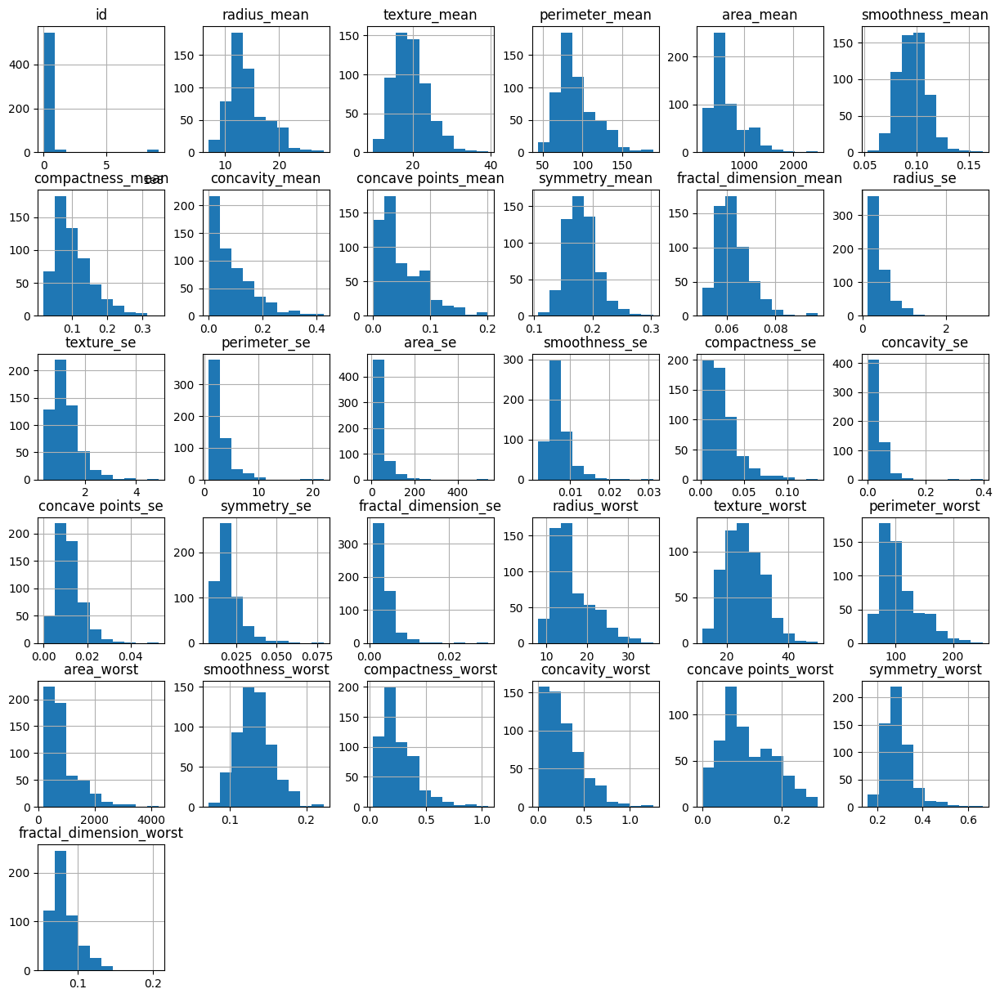

In [8]:
#generating histograms
plot = data.hist(figsize=(15,15))

Here I'm plotting histograms for each numerical column in the dataset. The hist() function in pandas is used to generate histograms for all numerical attributes in the breast cancer dataset

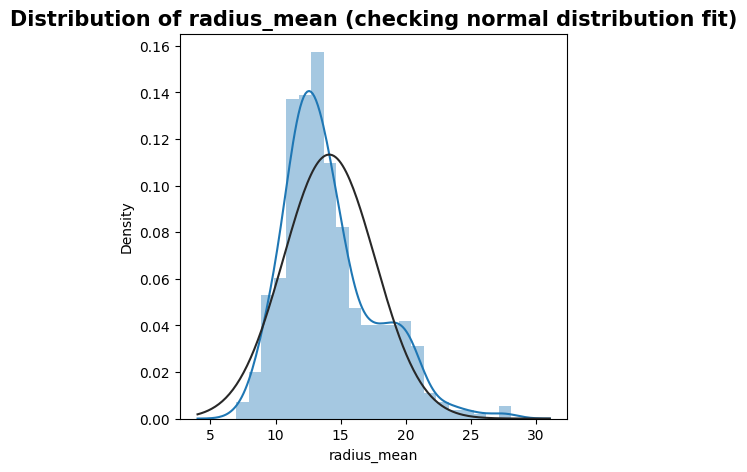

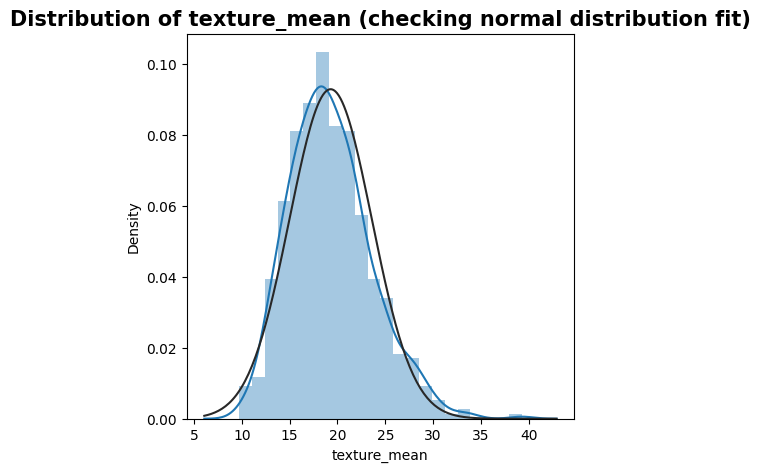

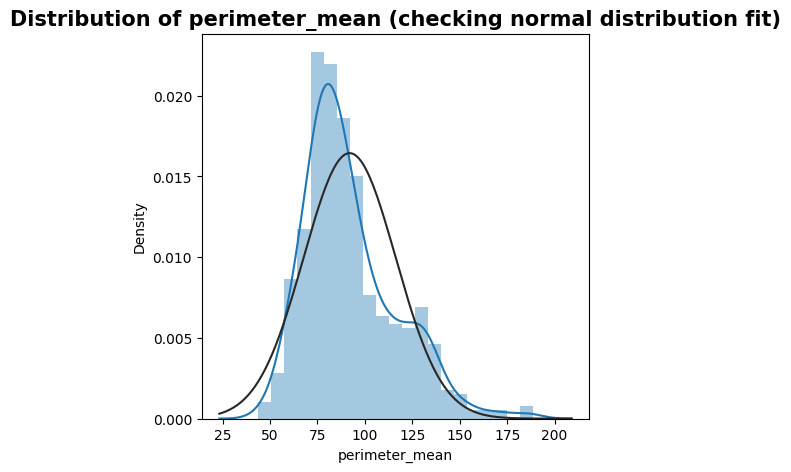

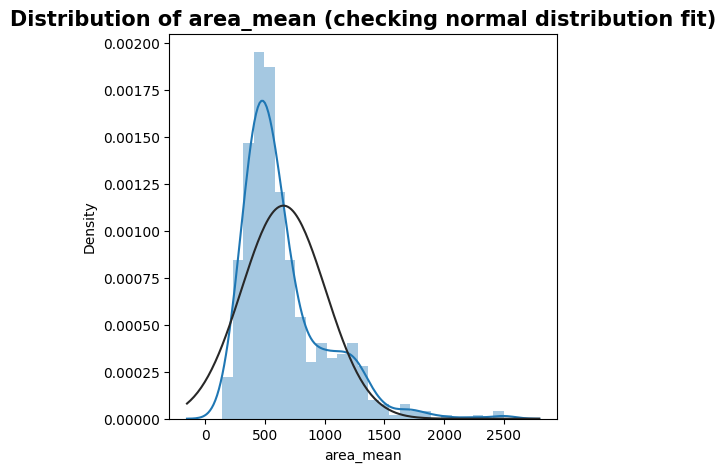

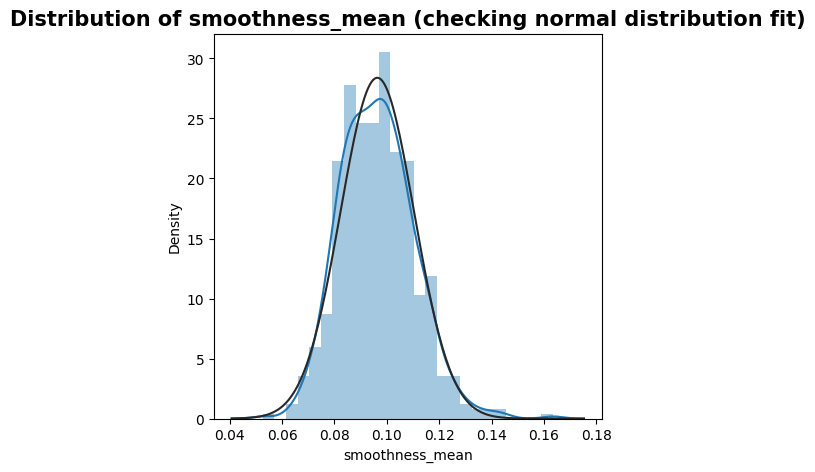

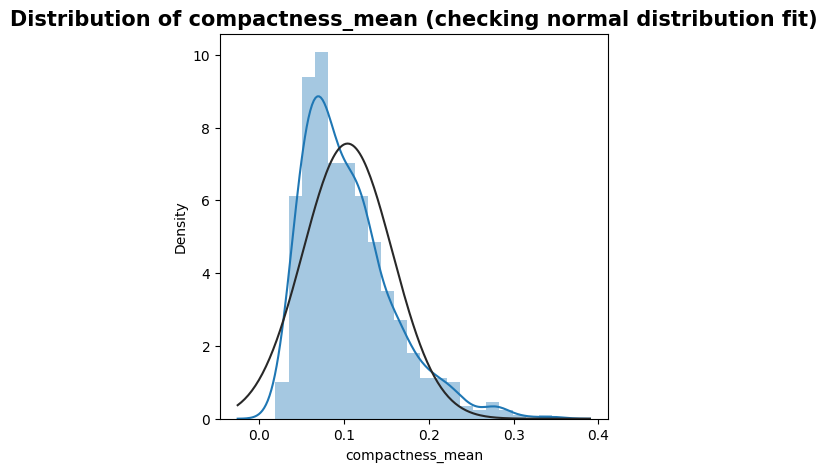

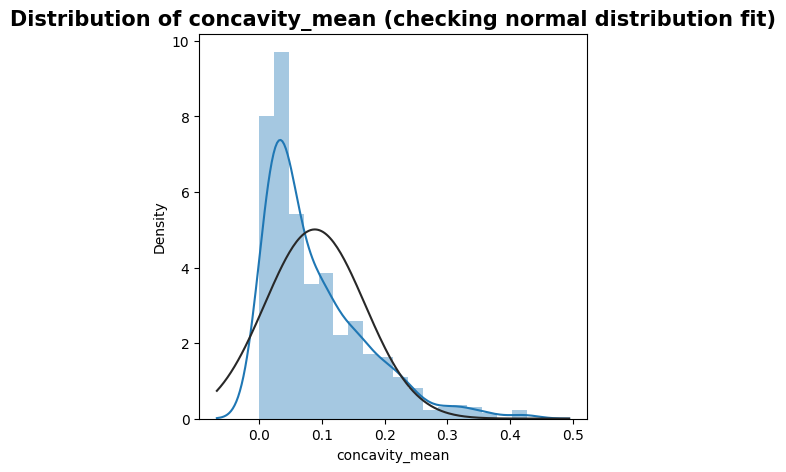

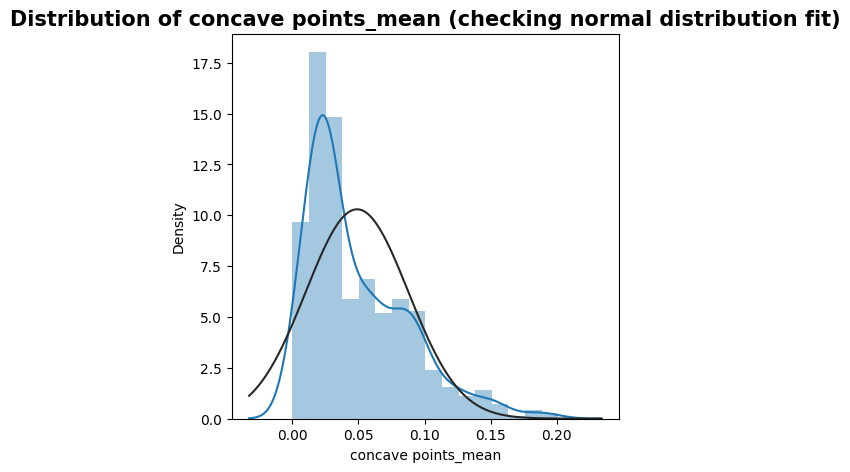

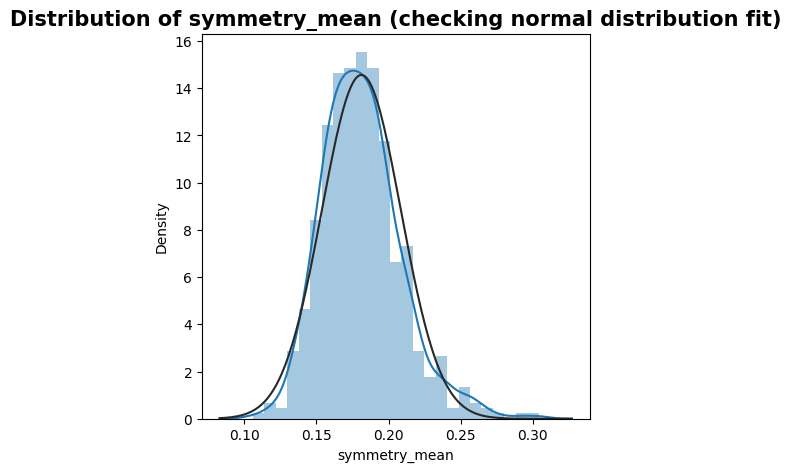

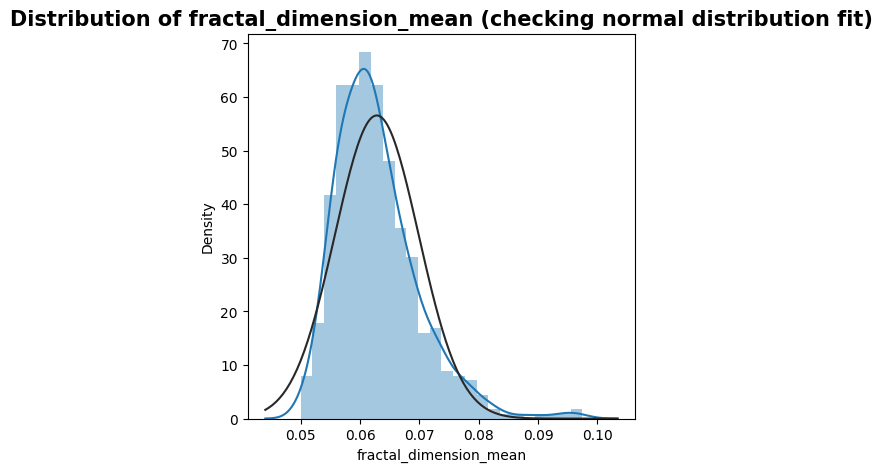

In [9]:
# Checking the distribution of independent(predictor) variables
datalist = ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean',
            'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean',
            'fractal_dimension_mean']
for i in datalist:
    from scipy import stats
    plt.figure(figsize=(5,5))
    sns.distplot(data[i], fit=stats.norm)
    plt.title(f"Distribution of {i} (checking normal distribution fit)",
              size=15, weight="bold")

## **Observations from the graphs for the breast cancer dataset:**

- **radius_mean:** normal distribution with a bit of right-skewness
- **texture_mean:** normal distribution with a bit of right-skewness
- **perimeter_mean:** normal distribution with a bit of right-skewness
- **area_mean:** normal distribution with a bit of right-skewness
- **smoothness_mean:** normal distribution
- **compactness_mean:** normal distribution with right-skewness
- **concavity_mean:** almost normal distribution
- **concave point_mean:** almost normal distribution with right-skewness
- **symmetry_mean:** normal distribution with a bit of right-skewness
- **fractal_dimension mean:** normal distribution with a bit of right-skewness





In [10]:
#Dropping dependent valirable from dataframe to obtain the distributions of independent variables
datafinal = data.drop('diagnosis', axis=1)

<Axes: >

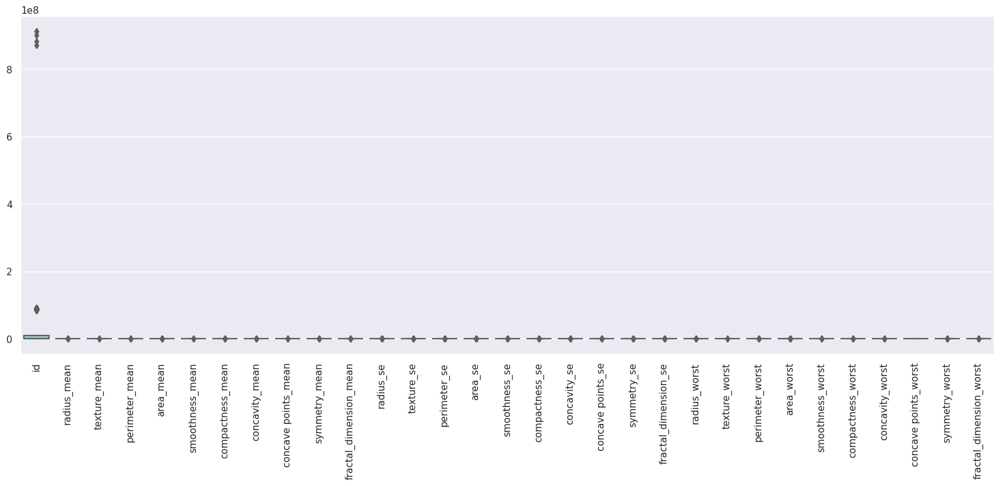

In [194]:
#Checking the Ranges of the predictor variables and dependent variable
plt.figure(figsize=(20,7))
plt.xticks(rotation=90)
sns.boxplot(data=datafinal, palette="Set3")

## **Observations:**

- The range is way too unpredictable and is dominating as compared to other predictor variables.
- Because of which it is suppressing other valiables Therefore, we are not able to visualize the ranges for other predictor variables. Hence we perform normalisation



### **So what should be do next to visualize ranges of other predictor variables?**

We will plot the charts separately to get the ranges of each one of them

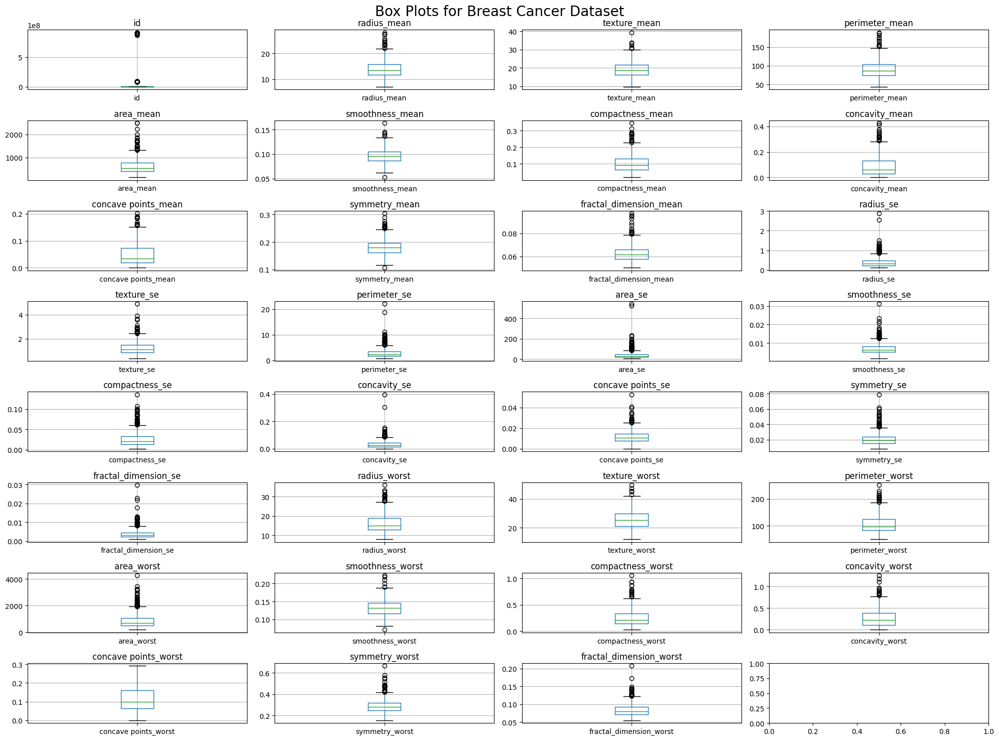

In [12]:
import matplotlib.pyplot as plt

# Create individual box plots for each numeric variable
fig, axes = plt.subplots(nrows=8, ncols=4, figsize=(20, 15))
fig.suptitle('Box Plots for Breast Cancer Dataset', fontsize=20)

for i, ax in enumerate(axes.flatten()):
    if i < len(datafinal.columns):
        datafinal.boxplot(column=datafinal.columns[i], ax=ax)
        ax.set_title(datafinal.columns[i])

plt.tight_layout()
plt.show()


In [193]:
datafinal.corr()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
id,1.000000,0.074626,0.099770,0.073159,0.096893,-0.012968,0.000096,0.050080,0.044158,-0.022114,...,0.082405,0.064720,0.079986,0.107187,0.010338,-0.002968,0.023203,0.035174,-0.044224,-0.029866
radius_mean,0.074626,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,0.147741,...,0.969539,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066
texture_mean,0.099770,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,0.071401,...,0.352573,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205
perimeter_mean,0.073159,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027,...,0.969476,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019
area_mean,0.096893,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,0.151293,...,0.962746,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738
smoothness_mean,-0.012968,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,0.557775,...,0.213120,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316
compactness_mean,0.000096,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,0.602641,...,0.535315,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382
concavity_mean,0.050080,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,0.500667,...,0.688236,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930
concave points_mean,0.044158,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,0.462497,...,0.830318,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661
symmetry_mean,-0.022114,0.147741,0.071401,0.183027,0.151293,0.557775,0.602641,0.500667,0.462497,1.000000,...,0.185728,0.090651,0.219169,0.177193,0.426675,0.473200,0.433721,0.430297,0.699826,0.438413


### **Observations:**
1. From the plots, we do not have much high correlation between features.
2. Perimeter_se and Radius_se have 0.97 correlation value.
3. Also Radius_mean and Perimeter_mean have 0.97 correlation value.

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


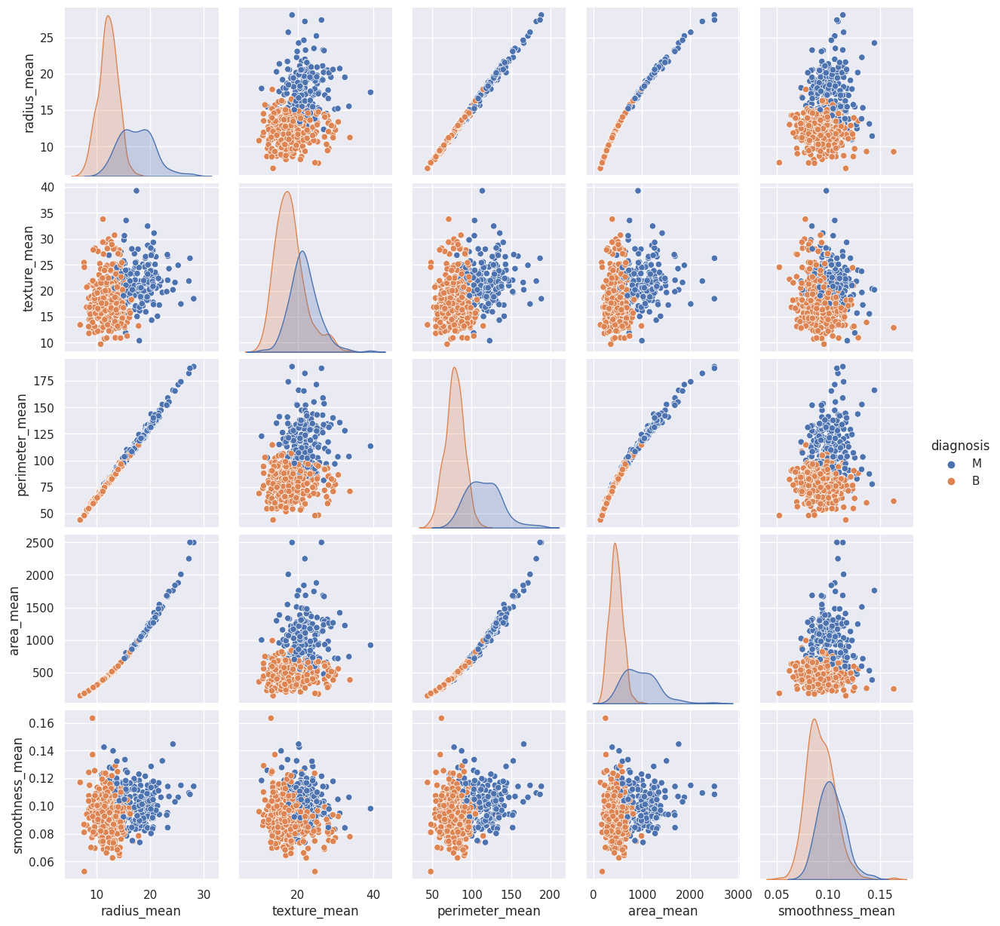

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

#pair plot to check the colinearity
selected_columns = ['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean']
sns.pairplot(data[selected_columns], hue='diagnosis')
plt.show()

## **What kind of data exploration did you do?**
#### First things first
- __Datatype Check__ - All the features in the dataset are Integers/ Float.
- __Missing Data Check__ - Our Dataset didn't had any missing values in any of the features
- __Distribution of training data__ - I checked the probability distribution of each and every feature in the training dataset and recorded observations
- __Correlation Check__ - I performed a correlation check on the dataset using heatmap and pirplot, the findings from it was that  the didn't had any significant multi colinearity issues.
- __Histogram Plot__ - I have also plotted histograms for each numerical column in the dataframe and analyzed individual feature distribution
- __Barplot__ - Performed Barplot analysis to findout how a variable impacts on prediction of disease

## **Data Cleaning**

- This dataset was relatively cleaner with no missing values. But handing missing values is one of the most important tasks in any Data Science project.
- I have performed various imputation techniques to acheive the same

## **How to handle missing data - Data Imputation techniques**
- Adding missing values to the original dataframe by randomly selecting a percentage of rows and columns (**1%, 5%, and 10%**) and replacing the values in those rows and columns with NaN.
 - Performing median and mode imputation of missing values
 - KNN Imputation
 - MICE Imputation

- Our dataset doesn't have any missing values, lets deliberately create some missing values and have a comparative analysis of how effectively each method impacts on accuracy

- We will remove 1%, 5% and 10% of the data from our dataset and see how well different imputation techniques recover the data back


In [14]:
diagnosis_mapping = {'M': 1.0, 'B': 0.0}
data['diagnosis'] = data['diagnosis'].map(diagnosis_mapping)


In [15]:
percent=[0.01,0.05,0.1]
train_data = data.astype(float)
cols=list(train_data.columns)
all_rows=[]
all_cols=[]
for per in percent:
    nan_rows_size=int(per*len(train_data))
    random_cols=np.random.choice(np.arange(len(cols)),nan_rows_size,replace=True)
    random_rows=np.random.choice(np.arange(len(train_data)),nan_rows_size,replace=False)
    all_rows.append(random_rows)
    all_cols.append(random_cols)

#creating new dataframe with 1%,5% and 10% missing values
predictors_missing_1_percent=train_data.copy()
for r_index,c_index in zip(all_rows[0],all_cols[0]):
    predictors_missing_1_percent.at[r_index,cols[c_index]]=np.NaN
predictors_missing_5_percent=train_data.copy()
for r_index,c_index in zip(all_rows[1],all_cols[1]):
    predictors_missing_5_percent.at[r_index,cols[c_index]]=np.NaN
predictors_missing_10_percent=train_data.copy()
for r_index,c_index in zip(all_rows[2],all_cols[2]):
    predictors_missing_10_percent.at[r_index,cols[c_index]]=np.NaN

In [16]:
#Printing missing values
print('Number of missing values')
print('1% missing',predictors_missing_1_percent.isna().sum().sum())
print('5% missing',predictors_missing_5_percent.isna().sum().sum())
print('10% missing',predictors_missing_10_percent.isna().sum().sum())
train_data.head(5)

Number of missing values
1% missing 5
5% missing 28
10% missing 56


,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302.0,1.0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517.0,1.0,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903.0,1.0,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301.0,1.0,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402.0,1.0,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [17]:
# Dropping NaN value rows from our 1%, 5% and 10% missing values dataframe and creating new dataframes
df_1_percent_without_nan=predictors_missing_1_percent.dropna()
df_5_percent_without_nan=predictors_missing_5_percent.dropna()
df_10_percent_without_nan=predictors_missing_10_percent.dropna()
df_1_percent_without_nan.info()

<class 'pandas.core.frame.DataFrame'>
Index: 564 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       564 non-null    float64
 1   diagnosis                564 non-null    float64
 2   radius_mean              564 non-null    float64
 3   texture_mean             564 non-null    float64
 4   perimeter_mean           564 non-null    float64
 5   area_mean                564 non-null    float64
 6   smoothness_mean          564 non-null    float64
 7   compactness_mean         564 non-null    float64
 8   concavity_mean           564 non-null    float64
 9   concave points_mean      564 non-null    float64
 10  symmetry_mean            564 non-null    float64
 11  fractal_dimension_mean   564 non-null    float64
 12  radius_se                564 non-null    float64
 13  texture_se               564 non-null    float64
 14  perimeter_se             564 no

1. Here we are dropping all the rows from the newly created dataframes with missing values that contain **NaN values**.
2. It creates new dataframes, called "df_1_percent_without_nan", "df_5_percent_without_nan", and "df_10_percent_without_nan", which do not contain any rows with NaN values.
3. These dataframes are created by using the "dropna()" function on the dataframes "predictors_missing_1_percent", "predictors_missing_5_percent", and "predictors_missing_10_percent", respectively.
4. Here we are creating new dataframes with the same data as the original dataframe, but with 1%, 5% and 10% of the data points replaced with NaN values. The original dataframe is copied using the copy() method, and then values are set to NaN using the at method of the dataframe.
5. Then, it is creating new dataframe with dropped na values from the above created dataframe with missing values. For example, df_1_percent_without_nan is created by dropping the NaN values from the predictors_missing_1_percent dataframe.
6. The info() method is then used to display information about the dataframe, such as the number of non-null values in each column.

In [18]:
# Importing the metrics library from sklearn
from sklearn import metrics as sm

# Defining the function to calculate model performance scores
def performnce_calcuation(y_true,y_pred):
    acc=sm.accuracy_score(y_true,y_pred)
    log_loss=sm.log_loss(y_true,y_pred)
    auc=sm.roc_auc_score(y_true,y_pred)
    confusion_matrix=sm.confusion_matrix(y_true,y_pred)
    return acc,auc,log_loss,confusion_matrix

In [19]:
num_cols = ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean']

cat_cols = ['diagnosis']

predict_impute_1 = pd.DataFrame()
predict_impute_5 = pd.DataFrame()
predict_impute_10 = pd.DataFrame()

# Imputing numerical columns with median
for col in num_cols:
    predict_impute_1[col] = predictors_missing_1_percent[col].fillna(predictors_missing_1_percent[col].median())
    predict_impute_5[col] = predictors_missing_5_percent[col].fillna(predictors_missing_5_percent[col].median())
    predict_impute_10[col] = predictors_missing_10_percent[col].fillna(predictors_missing_10_percent[col].median())

# Imputing categorical columns with mode
for col in cat_cols:
    predict_impute_1[col] = predictors_missing_1_percent[col].fillna(predictors_missing_1_percent[col].mode().iloc[0])
    predict_impute_5[col] = predictors_missing_5_percent[col].fillna(predictors_missing_5_percent[col].mode().iloc[0])
    predict_impute_10[col] = predictors_missing_10_percent[col].fillna(predictors_missing_10_percent[col].mode().iloc[0])




# **Imputation Method 1 : Impute Numerical values with Median and Categorical value with Mode**

In [20]:
from sklearn import tree
from sklearn.model_selection import train_test_split

model_1 = tree.DecisionTreeClassifier(random_state=42, max_depth=4)

# For 1% imputed data
predictors = predict_impute_1.drop('diagnosis', axis=1)
X_train, X_test, y_train, y_test = train_test_split(predictors, predict_impute_1['diagnosis'], test_size=0.25, random_state=42)
model_1.fit(X_train, y_train)
accuracy_1_te, auc_1_te, log_loss_1_te, cm_1_te = performnce_calcuation(y_test, model_1.predict(X_test))

# For 5% imputed data
predictors = predict_impute_5.drop('diagnosis', axis=1)
X_train, X_test, y_train, y_test = train_test_split(predictors, predict_impute_5['diagnosis'], test_size=0.25, random_state=42)
model_1.fit(X_train, y_train)
accuracy_2_te, auc_2_te, log_loss_2_te, cm_2_te = performnce_calcuation(y_test, model_1.predict(X_test))

# For 10% imputed data
predictors = predict_impute_10.drop('diagnosis', axis=1)
X_train, X_test, y_train, y_test = train_test_split(predictors, predict_impute_10['diagnosis'], test_size=0.25, random_state=42)
model_1.fit(X_train, y_train)
accuracy_3_te, auc_3_te, log_loss_3_te, cm_3_te = performnce_calcuation(y_test, model_1.predict(X_test))


In [21]:
print("-------------------------------")
print(f'For 1% Imputation Dataset')
print("-------------------------------")
print(f'Accuracy: {accuracy_1_te:.2f}')
print(f'AUC: {auc_1_te:.2f}')
print(f'Log Loss: {log_loss_1_te:.2f}')
print(f'Confusion Matrix:\n {cm_1_te}')
print("\n-------------------------------")
print(f'For 5% Imputation Dataset')
print("-------------------------------")
print(f'Accuracy: {accuracy_2_te:.2f}')
print(f'AUC: {auc_2_te:.2f}')
print(f'Log Loss: {log_loss_2_te:.2f}')
print(f'Confusion Matrix:\n {cm_2_te}')
print("\n-------------------------------")
print(f'For 10% Imputation Dataset')
print("-------------------------------")
print(f'Accuracy: {accuracy_3_te:.2f}')
print(f'AUC: {auc_3_te:.2f}')
print(f'Log Loss: {log_loss_3_te:.2f}')
print(f'Confusion Matrix:\n {cm_3_te}')
print("\n-------------------------------")

-------------------------------
For 1% Imputation Dataset
-------------------------------
Accuracy: 0.92
AUC: 0.92
Log Loss: 3.02
Confusion Matrix:
 [[80  9]
 [ 3 51]]

-------------------------------
For 5% Imputation Dataset
-------------------------------
Accuracy: 0.92
AUC: 0.92
Log Loss: 3.02
Confusion Matrix:
 [[80  9]
 [ 3 51]]

-------------------------------
For 10% Imputation Dataset
-------------------------------
Accuracy: 0.93
AUC: 0.93
Log Loss: 2.52
Confusion Matrix:
 [[82  7]
 [ 3 51]]

-------------------------------


# **Imputation Method 2 : Impute using KNN imputer**

In [23]:
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=5)

# For 1% imputed data
predictors = predict_impute_1.drop('diagnosis', axis=1)
all_col = list(predictors.columns)
final = imputer.fit_transform(predictors)
imputed_df_1 = pd.DataFrame(final, columns=all_col)
imputed_df_1['diagnosis'] = predict_impute_1['diagnosis'].values  # appending the target column back

# For 5% imputed data
predictors = predict_impute_5.drop('diagnosis', axis=1)
all_col = list(predictors.columns)
final = imputer.fit_transform(predictors)
imputed_df_5 = pd.DataFrame(final, columns=all_col)
imputed_df_5['diagnosis'] = predict_impute_5['diagnosis'].values  # appending the target column back

# For 10% imputed data
predictors = predict_impute_10.drop('diagnosis', axis=1)
all_col = list(predictors.columns)
final = imputer.fit_transform(predictors)
imputed_df_10 = pd.DataFrame(final, columns=all_col)
imputed_df_10['diagnosis'] = predict_impute_10['diagnosis'].values  # appending the target column back


In [24]:
from sklearn import tree
from sklearn.model_selection import train_test_split

model_1 = tree.DecisionTreeClassifier(random_state=42, max_depth=2)

# For 1% imputed data
predictors = predict_impute_1.drop('diagnosis', axis=1)
X_train, X_test, y_train, y_test = train_test_split(predictors, predict_impute_1['diagnosis'], test_size=0.25, random_state=42)
model_1.fit(X_train, y_train)
accuracy_1_te, auc_1_te, log_loss_1_te, cm_1_te = performnce_calcuation(y_test, model_1.predict(X_test))

# For 5% imputed data
predictors = predict_impute_5.drop('diagnosis', axis=1)
X_train, X_test, y_train, y_test = train_test_split(predictors, predict_impute_5['diagnosis'], test_size=0.25, random_state=42)
model_1.fit(X_train, y_train)
accuracy_2_te, auc_2_te, log_loss_2_te, cm_2_te = performnce_calcuation(y_test, model_1.predict(X_test))

# For 10% imputed data
predictors = predict_impute_10.drop('diagnosis', axis=1)
X_train, X_test, y_train, y_test = train_test_split(predictors, predict_impute_10['diagnosis'], test_size=0.25, random_state=42)
model_1.fit(X_train, y_train)
accuracy_3_te, auc_3_te, log_loss_3_te, cm_3_te = performnce_calcuation(y_test, model_1.predict(X_test))




In [25]:
print("-------------------------------")
print(f'For 1% Imputation Dataset')
print("-------------------------------")
print(f'Accuracy: {accuracy_1_te:.2f}')
print(f'AUC: {auc_1_te:.2f}')
print(f'Log Loss: {log_loss_1_te:.2f}')
print(f'Confusion Matrix:\n {cm_1_te}')
print("\n-------------------------------")
print(f'For 5% Imputation Dataset')
print("-------------------------------")
print(f'Accuracy: {accuracy_2_te:.2f}')
print(f'AUC: {auc_2_te:.2f}')
print(f'Log Loss: {log_loss_2_te:.2f}')
print(f'Confusion Matrix:\n {cm_2_te}')
print("\n-------------------------------")
print(f'For 10% Imputation Dataset')
print("-------------------------------")
print(f'Accuracy: {accuracy_3_te:.2f}')
print(f'AUC: {auc_3_te:.2f}')
print(f'Log Loss: {log_loss_3_te:.2f}')
print(f'Confusion Matrix:\n {cm_3_te}')
print("\n-------------------------------")

-------------------------------
For 1% Imputation Dataset
-------------------------------
Accuracy: 0.92
AUC: 0.93
Log Loss: 2.77
Confusion Matrix:
 [[81  8]
 [ 3 51]]

-------------------------------
For 5% Imputation Dataset
-------------------------------
Accuracy: 0.92
AUC: 0.93
Log Loss: 2.77
Confusion Matrix:
 [[81  8]
 [ 3 51]]

-------------------------------
For 10% Imputation Dataset
-------------------------------
Accuracy: 0.92
AUC: 0.93
Log Loss: 2.77
Confusion Matrix:
 [[81  8]
 [ 3 51]]

-------------------------------


#  **Imputation Method 3 : MICE Imputation technique**

In [26]:
!pip install fancyimpute
#from sklearn.impute import IterativeImputer
from fancyimpute import IterativeImputer as MICE
import pandas as pd


# create a copy of the original dataframe with missing values
df_missing = predictors
df_missing.iloc[2:5,3:6] = np.nan

# create an imputer object
imputer = MICE()

# fit the imputer on the data
imputer.fit(predictors)

#MICE().fit_transform(df)


# perform the imputation
df_imputed = imputer.transform(predictors)

predictors=predict_impute_1.drop('diagnosis',axis=1)
all_col=list(predictors.columns)
final=imputer.fit_transform(predictors)
imputed_df_1=pd.DataFrame(final,columns=all_col)

predictors=predict_impute_5.drop('diagnosis',axis=1)
all_col=list(predictors.columns)
final=imputer.fit_transform(predictors)
imputed_df_5=pd.DataFrame(final,columns=all_col)

predictors=predict_impute_10.drop('diagnosis',axis=1)
all_col=list(predictors.columns)
final=imputer.fit_transform(predictors)
imputed_df_10=pd.DataFrame(final,columns=all_col)


In [27]:
model_1=tree.DecisionTreeClassifier(random_state=42,max_depth=4)

predictors=df_1_percent_without_nan.drop('diagnosis',axis=1)
X_train, X_test, y_train, y_test = train_test_split(predictors, df_1_percent_without_nan['diagnosis'], test_size=0.25, random_state=42)
model_1.fit(X_train,y_train)

accuracy_1_te,auc_1_te,log_loss_1_te,cm_1_te=performnce_calcuation(y_test,model_1.predict(X_test))

predictors=df_5_percent_without_nan.drop('diagnosis',axis=1)
X_train, X_test, y_train, y_test = train_test_split(predictors, df_5_percent_without_nan['diagnosis'], test_size=0.25, random_state=42)
model_1.fit(X_train,y_train)

accuracy_2_te,auc_2_te,log_loss_2_te,cm_2_te=performnce_calcuation(y_test,model_1.predict(X_test))

predictors=df_10_percent_without_nan.drop('diagnosis',axis=1)
X_train, X_test, y_train, y_test = train_test_split(predictors, df_10_percent_without_nan['diagnosis'], test_size=0.25, random_state=42)
model_1.fit(X_train,y_train)

accuracy_3_te,auc_3_te,log_loss_3_te,cm_3_te=performnce_calcuation(y_test,model_1.predict(X_test))


In [28]:
print("-------------------------------")
print(f'For 1% Imputation Dataset')
print("-------------------------------")
print(f'Accuracy: {accuracy_1_te:.2f}')
print(f'AUC: {auc_1_te:.2f}')
print(f'Log Loss: {log_loss_1_te:.2f}')
print(f'Confusion Matrix:\n {cm_1_te}')
print("\n-------------------------------")
print(f'For 5% Imputation Dataset')
print("-------------------------------")
print(f'Accuracy: {accuracy_2_te:.2f}')
print(f'AUC: {auc_2_te:.2f}')
print(f'Log Loss: {log_loss_2_te:.2f}')
print(f'Confusion Matrix:\n {cm_2_te}')
print("\n-------------------------------")
print(f'For 10% Imputation Dataset')
print("-------------------------------")
print(f'Accuracy: {accuracy_3_te:.2f}')
print(f'AUC: {auc_3_te:.2f}')
print(f'Log Loss: {log_loss_3_te:.2f}')
print(f'Confusion Matrix:\n {cm_3_te}')
print("\n-------------------------------")

-------------------------------
For 1% Imputation Dataset
-------------------------------
Accuracy: 0.92
AUC: 0.92
Log Loss: 2.81
Confusion Matrix:
 [[73  3]
 [ 8 57]]

-------------------------------
For 5% Imputation Dataset
-------------------------------
Accuracy: 0.94
AUC: 0.94
Log Loss: 2.12
Confusion Matrix:
 [[71  4]
 [ 4 57]]

-------------------------------
For 10% Imputation Dataset
-------------------------------
Accuracy: 0.94
AUC: 0.93
Log Loss: 2.24
Confusion Matrix:
 [[81  3]
 [ 5 40]]

-------------------------------


# **Interpreting the Imputation Methods**

Here are some conclusions that can be drawn from the the aboveresults:

- __Median and mode imputation:__ The accuracy initially decreases from 1% to 5% imputation, but then increases after more data imputation ie at 10%. This suggests that median and mode imputation may not be effective in handling missing values, as the drop in accuracy indicates loss of valuable information. However, with more imputation, the accuracy starts to recover, indicating that the imputed values may be getting closer to the true values as more data is imputed.

- __KNN imputation:__ The accuracy decreased  after 1% imputation, but then increases from 5% to 10% imputation. This suggests that KNN imputation may not be effective in improving model accuracy, as the imputed values may not be accurate enough to reflect the true underlying patterns in the data.

- __MICE (Multivariate Imputation by Chained Equations) technique:__ The accuracy initially decreases after 1% imputation, but then shows a significant increase after 10% imputation. This suggests that MICE technique may be more effective compared to median, mode, or KNN imputation, as it results in improved accuracy with more imputed data.

- However, the accuracy for all imputation techniques is less than the base model's accuracy. This suggests that imputation of missing values may not fully compensate for the loss of information due to missing data, and the imputed values may not accurately reflect the true underlying patterns in the data.

In conclusion, the choice of imputation technique and the amount of imputed data can significantly impact model accuracy.




# **Feature Importance and Selection**

- Lets fit a very simple linear model to understand how the predictor variable are impactimng in prediction of Kidney Disease


### **Normalization**

In [29]:
from sklearn import preprocessing
import pandas as pd

# Assuming 'data' is your breast cancer dataset, and you want to normalize specific columns
columns_to_normalize = [
    'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
    'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean',
    'symmetry_mean', 'fractal_dimension_mean',
    'radius_se', 'texture_se', 'perimeter_se', 'area_se',
    'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se',
    'symmetry_se', 'fractal_dimension_se',
    'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst',
    'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst',
    'symmetry_worst', 'fractal_dimension_worst'
]

# Create x to store scaled values as floats
x = datafinal[columns_to_normalize].values.astype(float)

# Preparing for normalizing
min_max_scaler = preprocessing.MinMaxScaler()

# Transform the data to fit minmax processor
x_scaled = min_max_scaler.fit_transform(x)

# Replace the original columns with normalized values in the DataFrame
datafinal[columns_to_normalize] = pd.DataFrame(x_scaled)



In [30]:
#data after noromalizing and feature creation
datafinal.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,0.338222,0.323965,0.332935,0.216920,0.394785,0.260601,0.208058,0.243137,0.379605,...,0.296663,0.363998,0.283138,0.170906,0.404138,0.220212,0.217403,0.393836,0.263307,0.189596
std,1.250206e+08,0.166787,0.145453,0.167915,0.149274,0.126967,0.161992,0.186785,0.192857,0.138456,...,0.171940,0.163813,0.167352,0.139932,0.150779,0.152649,0.166633,0.225884,0.121954,0.118466
min,8.670000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,8.692180e+05,0.223342,0.218465,0.216847,0.117413,0.304595,0.139685,0.069260,0.100944,0.282323,...,0.180719,0.241471,0.167837,0.081130,0.300007,0.116337,0.091454,0.223127,0.185098,0.107700
50%,9.060240e+05,0.302381,0.308759,0.293345,0.172895,0.390358,0.224679,0.144189,0.166501,0.369697,...,0.250445,0.356876,0.235320,0.123206,0.397081,0.179110,0.181070,0.343402,0.247782,0.163977
75%,8.813129e+06,0.416442,0.408860,0.416765,0.271135,0.475490,0.340531,0.306232,0.367793,0.453030,...,0.386339,0.471748,0.373475,0.220901,0.494156,0.302520,0.305831,0.554639,0.318155,0.242949
max,9.113205e+08,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## **Observations:**
We can see that the numerical variables - radium_mean, texture_mean, perimeter_mean, area_mean, smoothness_mean, compactness_mean, concavity_mean, concave_points_mean, symmetry_mean and other variables are now in the range of 0 to 1

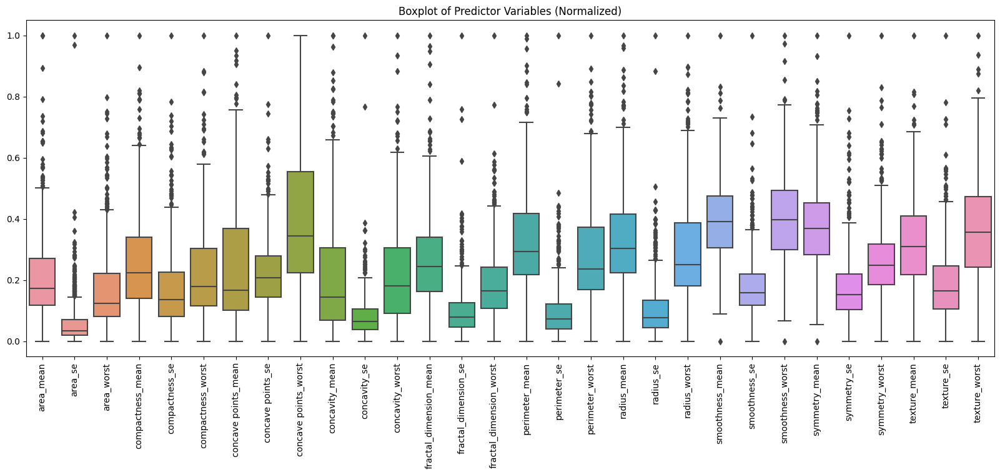

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a figure and set its size
plt.figure(figsize=(20, 7))

# Assuming 'datafinal' is your breast cancer dataset
# Exclude the 'id' column (if you don't want to plot it)
columns_to_plot = datafinal.columns.difference(['id'])

# Create a boxplot for the remaining columns
sns.boxplot(data=datafinal[columns_to_plot])

# Set the plot title
plt.title("Boxplot of Predictor Variables (Normalized)")

# Rotate x-axis labels for better visibility (optional)
plt.xticks(rotation=90)

# Show the plot
plt.show()


## **Observations:**

Now it is clear to visualize and interpret the data. Looking at the boxplot above, we can infer below:

Nearly all variables have outliers

In [36]:
# Scaling the data using Min-Max scaling for the purpose of evaluating Co-efficients, as non scaled data may mislead while we evaluate the co-efficients

df = data.drop(["diagnosis"], axis=1)
df_norm = (df - df.min()) / (df.max() - df.min())
df_norm = pd.concat([df_norm, data['diagnosis']], axis=1)


In [39]:
print(df_norm.columns)

Index(['id', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
       'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'diagnosis'],
      dtype='object')


In [40]:
import statsmodels.formula.api as smf  # OLS model Library
df_norm.columns = [col.replace(' ', '_') for col in df_norm.columns]

# Adjust the formula to include the features from your breast cancer dataset
results = smf.ols(
    "diagnosis ~ radius_mean + texture_mean + perimeter_mean + area_mean + smoothness_mean + compactness_mean + concavity_mean + concave_points_mean + symmetry_mean + fractal_dimension_mean + radius_se + texture_se + perimeter_se + area_se + smoothness_se + compactness_se + concavity_se + concave_points_se + symmetry_se + fractal_dimension_se + radius_worst + texture_worst + perimeter_worst + area_worst + smoothness_worst + compactness_worst + concavity_worst + concave_points_worst + symmetry_worst + fractal_dimension_worst",
    data=df_norm
).fit()

print(results.summary())



                            OLS Regression Results                            
Dep. Variable:              diagnosis   R-squared:                       0.774
Model:                            OLS   Adj. R-squared:                  0.762
Method:                 Least Squares   F-statistic:                     61.53
Date:                Mon, 11 Dec 2023   Prob (F-statistic):          6.05e-153
Time:                        17:19:13   Log-Likelihood:                 29.650
No. Observations:                 569   AIC:                             2.699
Df Residuals:                     538   BIC:                             137.4
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

We will consider a significance value of 0.05 for determining the significance of our predictor variables which means if

p value is greater that 0.05 - feature is not significant for predicting the target variable
p value is less than 0.05 - feature is significant for predicting the target variable

## **Observations:**

Summary of the p-values for each predictor variable in your regression results:
- Intercept has a p-value of 0.000, which is less than 0.05, indicating that it is a significant feature.
- **radius_mean** has a p-value of 0.210, which is greater than 0.05, indicating that it is not a significant feature.
- **texture_mean** has a p-value of 0.567, which is greater than 0.05, indicating that it is not a significant feature.
- **perimeter_mean** has a p-value of 0.345, which is greater than 0.05, indicating that it is not a significant feature.
- **area_mean** has a p-value of 0.545, which is greater than 0.05, indicating that it is not a significant feature.
- **smoothness_mean** has a p-value of 0.967, which is greater than 0.05, indicating that it is not a significant feature.
- **compactness_mean** has a p-value of 0.002, which is less than 0.05, indicating that it is a significant feature.
- **concavity_mean** has a p-value of 0.182, which is greater than 0.05, indicating that it is not a significant feature.
- **concave_points_mean** has a p-value of 0.280, which is greater than 0.05, indicating that it is not a significant feature.
- **symmetry_mean** has a p-value of 0.890, which is greater than 0.05, indicating that it is not a significant feature.
- **fractal_dimension_mean** has a p-value of 0.995, which is greater than 0.05, indicating that it is not a significant feature.
- **radius_se** has a p-value of 0.162, which is greater than 0.05, indicating that it is not a significant feature.
- **texture_se** has a p-value of 0.855, which is greater than 0.05, indicating that it is not a significant feature.
- **perimeter_se** has a p-value of 0.584, which is greater than 0.05, indicating that it is not a significant feature.
- **area_se** has a p-value of 0.509, which is greater than 0.05, indicating that it is not a significant feature.
- smoothness_se has a p-value of 0.017, which is less than 0.05, indicating that it is a significant feature.
- **compactness_se** has a p-value of 0.976, which is greater than 0.05, indicating that it is not a significant feature.
- concavity_se has a p-value of 0.006, which is less than 0.05, indicating that it is a significant feature.
- **concave_points_se** has a p-value of 0.053, which is greater than 0.05, indicating that it is not a significant feature.
- **symmetry_se** has a p-value of 0.534, which is greater than 0.05, indicating that it is not a significant feature.
- **fractal_dimension_se** has a p-value of 0.541, which is greater than 0.05, indicating that it is not a significant feature.
- **radius_worst** has a p-value of 0.001, which is less than 0.05, indicating that it is a significant feature.
- **texture_worst** has a p-value of 0.303, which is greater than 0.05, indicating that it is not a significant feature.
- **perimeter_worst** has a p-value of 0.682, which is greater than 0.05, indicating that it is not a significant feature.
- **area_worst** has a p-value of 0.002, which is less than 0.05, indicating that it is a significant feature.
- **smoothness_worst** has a p-value of 0.705, which is greater than 0.05, indicating that it is not a significant feature.
- **compactness_worst** has a p-value of 0.861, which is greater than 0.05, indicating that it is not a significant feature.
- **concavity_worst** has a p-value of 0.156, which is greater than 0.05, indicating that it is not a significant feature.
- **concave_points_worst** has a p-value of 0.612, which is greater than 0.05, indicating that it is not a significant feature.
- **symmetry_worst** has a p-value of 0.260, which is greater than 0.05, indicating that it is not a significant feature.
- **fractal_dimension_worst** has a p-value of 0.072, which is greater than 0.05, indicating that it is not a significant feature.

Lets consider only these features and calculate the model fit again, and then lets have a comparative analysis of both models.

In [45]:
df_norm_feature_selected = df_norm[
    [
        'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'diagnosis'  # Include 'diagnosis'
    ]
]

results2 = smf.ols(
    "diagnosis ~ radius_mean + texture_mean + perimeter_mean + area_mean",
    data=df_norm_feature_selected,
).fit()

print(results2.summary())  # OLS Linear Model Summary


                            OLS Regression Results                            
Dep. Variable:              diagnosis   R-squared:                       0.618
Model:                            OLS   Adj. R-squared:                  0.615
Method:                 Least Squares   F-statistic:                     228.2
Date:                Mon, 11 Dec 2023   Prob (F-statistic):          2.31e-116
Time:                        17:23:20   Log-Likelihood:                -120.04
No. Observations:                 569   AIC:                             250.1
Df Residuals:                     564   BIC:                             271.8
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         -0.5859      0.056    -10.

In [52]:
predicted_diagnosis = results2.predict(
    df_norm[
        ["radius_mean", "texture_mean", "perimeter_mean", "area_mean","diagnosis"]
    ]
)

df_norm["predicted_diagnosis"] = predicted_diagnosis.round()


In [53]:
predicted_disease_2 = results2.predict(
    df_norm_feature_selected[
        ["radius_mean", "texture_mean", "perimeter_mean", "area_mean"]
    ]
)

df_norm_feature_selected["predicted_disease_2"] = predicted_disease_2.round()


In [54]:
# Function to calculate how well the data has been recovered after performing data imputation
def percentage_change(l1, l2):
    percent_change = abs(l2 - l1) / (l1 + 0.000000001)
    avg_change = (percent_change.sum() / percent_change.count()) * 100
    return avg_change

In [55]:
def percentage_change(original, predicted):
    # Assuming this function calculates the percentage of incorrect predictions
    # You should define this function based on your specific needs
    return ((original != predicted).sum() / len(original)) * 100

print(
    "Accuracy of predicting Breast Cancer using all features = ",
    100 - percentage_change(df_norm["diagnosis"], df_norm["predicted_diagnosis"]),
)
print(
    "Accuracy of predicting Breast Cancer using only selected features = ",
    100 - percentage_change(
        df_norm_feature_selected["diagnosis"],
        df_norm_feature_selected["predicted_disease_2"],
    ),
)


Accuracy of predicting Breast Cancer using all features =  89.63093145869948
Accuracy of predicting Breast Cancer using only selected features =  89.63093145869948


## **Observations:**
From the above two summaries we can interpret that after selecting only the significant features(features with P value less than 0.05) it had little to no effect on the outcome compare to the model which uses all the features.

From the above two interpretations, our observation is that in both the cases our model predicts the chances of person affecting with Breast Cancer Disease very good and they are same to each other i.e **89.61%**

From the above studies let's stick to the data with all featues and try using different models

In [57]:
df_norm = df_norm.drop(["predicted_diagnosis"], axis=1)

In [58]:
X = df_norm.drop(["diagnosis"], axis=1)  # Training Features
Y = df_norm["diagnosis"]  # Target


# **How did you split the data into train, and test?**
- Here I have split the data into training and test data in the ratio of 9:1 respectively

In [59]:
 import shap

 # Splitting Data into Training and Test
(
    x_train,
    x_test,
    y_train,
    y_test,
) = train_test_split(
    X, Y, test_size=0.1, random_state=42
)
  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process
x_train_100 = shap.utils.sample(
    x_train, 100
)
# Taking 100 samples out for SHAP analysis as it is a computationally expensive process
x_test_100 = shap.utils.sample(
    x_test, 100
)

# Fitting Linear Model

In [60]:
import sklearn

linear_model = sklearn.linear_model.LinearRegression()  # Initializing a Linear Model
linear_model.fit(x_train, y_train)  # Training a linear model

LinearRegression()

In [61]:
y_linear_predictions = linear_model.predict(x_test).round()

# Fitting Tree Based Model

In [62]:
from sklearn.ensemble import RandomForestRegressor

tree_model = RandomForestRegressor(
    max_depth=X.shape[1], random_state=0, n_estimators=10
)
tree_model.fit(x_train, y_train)

RandomForestRegressor(max_depth=31, n_estimators=10, random_state=0)

In [63]:
y_tree_based_predictions = tree_model.predict(x_test).round()

# Fitting a Support Vector Machine (SVM)

In [64]:
from sklearn import svm

regr = svm.SVR()
svm_model = regr.fit(x_train, y_train)

In [65]:
svm_predictions = svm_model.predict(x_test).round()

# **Using AutoML to find out the best Model**

In [66]:
# Setting up maximum runtime for the AutoML
min_mem_size = 6
run_time = 222


In [69]:
# Setting up memory
pct_memory = 0.5
virtual_memory = psutil.virtual_memory()
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))
print(min_mem_size)

6


In [70]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no = random.randint(5555, 55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:47432..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.21" 2023-10-17; OpenJDK Runtime Environment (build 11.0.21+9-post-Ubuntu-0ubuntu122.04); OpenJDK 64-Bit Server VM (build 11.0.21+9-post-Ubuntu-0ubuntu122.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp7s8rg378
  JVM stdout: /tmp/tmp7s8rg378/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp7s8rg378/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:47432
Connecting to H2O server at http://127.0.0.1:47432 ... successful.


H2O_cluster_uptime:,05 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.44.0.2
H2O_cluster_version_age:,1 month and 3 days
H2O_cluster_name:,H2O_from_python_unknownUser_jzn5yp
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,6 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [100]:
# Converting Pandas dataframe in H2O dataframe
df = h2o.H2OFrame(
    data
)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [101]:
pct_rows = 0.80  # Setting up the data split between training and test dataset.
df_train, df_test = df.split_frame([pct_rows])

In [102]:
# Setting up AutoML
def autoML(df_train, df_test):

    X = df_train.columns
    y = "diagnosis"

    X.remove(y)  # Removing the result frm our predictors data

    aml = H2OAutoML(max_runtime_secs=222, seed=1)  # Setting of AutoML
    aml.train(
        x=X, y=y, training_frame=df_train
    )  # Trainig the dataset on different models

    return df_train, df_test, aml


# Function to get best model from the AutoML leaderboard
def getBestModel(aml):
    model_index = 0
    glm_index = 0
    aml_leaderboard_df = aml.leaderboard.as_data_frame()
    models_dict = {}

    for m in aml_leaderboard_df["model_id"]:
        models_dict[m] = model_index
        if "StackedEnsemble" not in m and "GBM" not in m:
            break
        model_index = model_index + 1

    for m in aml_leaderboard_df["model_id"]:
        if "GLM" in m:
            models_dict[m] = glm_index
            break
        glm_index = glm_index + 1

    print(model_index)
    best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])
    return best_model

In [130]:
print(train.columns)

['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']


In [132]:


# Print first few rows to check the data
print(train.head())




              id    diagnosis    radius_mean    texture_mean    perimeter_mean    area_mean    smoothness_mean    compactness_mean    concavity_mean    concave points_mean    symmetry_mean    fractal_dimension_mean    radius_se    texture_se    perimeter_se    area_se    smoothness_se    compactness_se    concavity_se    concave points_se    symmetry_se    fractal_dimension_se    radius_worst    texture_worst    perimeter_worst    area_worst    smoothness_worst    compactness_worst    concavity_worst    concave points_worst    symmetry_worst    fractal_dimension_worst
 87930                      0          12.47           18.6              81.09        481.9            0.09965             0.1058            0.08005                0.03821           0.1925                   0.06373       0.3961        1.044            2.497      30.29         0.006953           0.01911        0.02701              0.01037         0.01782                0.003586           14.97            24.64             

In [133]:
# Ensure the 'concave_points_mean' column is in X
print(list(X.columns))

['id', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave_points_worst', 'symmetry_worst', 'fractal_dimension_worst']


In [134]:
print(train.columns)
print(validate.columns)
print(test.columns)


['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']
['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst',

In [103]:
 # Training AutoML
autoML = autoML(df_train, df_test)


AutoML progress: |
19:54:25.929: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

██
19:54:30.640: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
19:54:31.705: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

█
19:54:35.440: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

█
19:54:35.720: _response param, We have dete

In [104]:
 # Leaderbord of AutoML output
autoML[2].leaderboard

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_BestOfFamily_4_AutoML_1_20231211_195425,0.171979,0.0295767,0.0958174,0.122479,0.0295767
StackedEnsemble_BestOfFamily_2_AutoML_1_20231211_195425,0.179629,0.0322665,0.0891373,0.126873,0.0322665
StackedEnsemble_AllModels_2_AutoML_1_20231211_195425,0.180628,0.0326264,0.0904189,0.127867,0.0326264
StackedEnsemble_AllModels_1_AutoML_1_20231211_195425,0.18148,0.0329352,0.090444,0.127998,0.0329352
StackedEnsemble_BestOfFamily_3_AutoML_1_20231211_195425,0.182302,0.0332342,0.0919529,0.128565,0.0332342
DRF_1_AutoML_1_20231211_195425,0.182897,0.0334515,0.0737224,0.129505,0.0334515
GBM_2_AutoML_1_20231211_195425,0.184432,0.034015,0.0832265,0.130407,0.034015
GBM_grid_1_AutoML_1_20231211_195425_model_18,0.185415,0.0343788,0.0887185,0.130663,0.0343788
XGBoost_grid_1_AutoML_1_20231211_195425_model_16,0.186287,0.0347027,0.0916596,0.131469,0.0347027
GBM_grid_1_AutoML_1_20231211_195425_model_8,0.1863,0.0347076,0.0759713,0.130124,0.0347076


## **Evaluation:**
After the models are trained, we can compare the model performance using the leaderboard. H2O AutoML produces a leaderboard which ranks the trained model based on a predefined metric. By default it ranks models by ascending order of logloss and rmse for classification and regression task respectively.

In [105]:
# Printing Best Model
autoML_model = getBestModel(autoML[2])

5


In [106]:
autoML_best_predictions = autoML_model.predict(df_test).round()

drf prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [107]:
autoMLpredictions = h2o.as_list(autoML_best_predictions, use_pandas=False)
y_test_h2O = h2o.as_list(df_test["diagnosis"], use_pandas=False)

In [108]:
def flatten(t):
    listt = [(item) for sublist in t for item in sublist][1:]
    listt = [float(x) for x in listt]
    x = pd.Series(listt)
    return x

In [109]:
autoMLpredictions = flatten(autoMLpredictions)
y_test_h2O = flatten(y_test_h2O)

# **Hyperparameter Tuning of AutoML's Best Model**

The goal of __hyperparameter tuning__ is to find the hyperparameters that produce the best performance on the test set, while avoiding overfitting on the training set. It is an important step in the machine learning pipeline, as the choice of hyperparameters can have a significant impact on the accuracy and generalization of a machine learning model.

# What evaluation metric are you using?

The evaluation metrics which I am using here are

Mean Squared Error
Root Mean Squared Error
Mean Absolute Error
Mean Residual Deviance
Accuracy

- These evaluation metrics are used to evaluate the best model

- The residual deviance tells us how well the response variable can be predicted by a model with p predictor variables. The lower the value, the better the model is able to predict the value of the response variable.

- Accuracy tells us how correct and precise our model is.

In [150]:
#train test and split
train, validate, test = np.split(
    data.sample(frac=1, random_state=42),
    [int(0.6 * len(df)), int(0.8 * len(df))],
)
train = h2o.H2OFrame(train)
validate = h2o.H2OFrame(validate)
test = h2o.H2OFrame(test)

drf_hyper_params = {

    "ntrees": [10, 25, 50, 75, 100],
    "max_depth": [5, 7, 10, 14],
    "sample_rate": [0.25, 0.5, 0.75, 1.0]
}

search_criteria = {"strategy": "RandomDiscrete", "max_models": 100, "seed": 1}

#  creating the H2OGridSearch object
gbm_grid4 = H2OGridSearch(
    model=H2ORandomForestEstimator,
    grid_id="gbm_grid4",
    hyper_params=drf_hyper_params,
    search_criteria=search_criteria,
)
# Print columns of df_train to verify
print("Columns in df_train:", df_train.columns)

# Assign all other columns as features to X
X = df_train.columns
X.remove('diagnosis')  # Remove target variable from feature list

# Print X to confirm
print("Feature columns in X:", X)

# Now use X in your training
gbm_grid4.train(
    x=X,
    y="diagnosis",
    training_frame=train,
    validation_frame=validate,
    seed=1,
)

#finding best model
def find_best_model_from_grid(h2o_grid, test_parameter):
    model_list = []
    for grid_item in h2o_grid:
        if test_parameter is "r2":
            if not (grid_item.r2() == "NaN"):
                model_list.append(grid_item.r2())
            else:
                model_list.append(0.0)
        elif test_parameter is "auc":
            if not (grid_item.auc() == "NaN"):
                model_list.append(grid_item.auc())
            else:
                model_list.append(0.0)
    max_index = model_list.index(max(model_list))
    best_model = h2o_grid[max_index]
    print("Model ID with best R2: " + best_model.model_id)
    if test_parameter is "r2":
        print("Best R2: " + str(best_model.r2()))
    elif test_parameter is "auc":
        print("Best AUC: " + str(best_model.auc()))
    return best_model


best_model = find_best_model_from_grid(gbm_grid4, "r2")

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Columns in df_train: ['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']
Feature columns in X: ['id', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean',

### **How do training, validation, and test metrics compare?**
The best model (AutoML's Hyperparameter tuned model) has done pretty well on both the Training Dataset as well as Validation Dataset.

As the Mean Residual Deviance of this model on training and validation dataset is ~0.03 and ~0.029 respectively. Also, the other metrics on both of the dataset validates that the model is not overfitting the Training Data. Please refer below to see the Evaluation Metrics on both training and validation dataset.

In [157]:
#printing the best model

print(best_model)

Model Details
H2ORandomForestEstimator : Distributed Random Forest
Model Key: gbm_grid4_model_25


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    25                 25                          5827                   5            8            6.24          10            19            13.96

ModelMetricsRegression: drf
** Reported on train data. **

MSE: 0.03165032018550445
RMSE: 0.17790536862473952
MAE: 0.05862415525172122
RMSLE: 0.1249423442132513
Mean Residual Deviance: 0.03165032018550445

ModelMetricsRegression: drf
** Reported on validation data. **

MSE: 0.029684210526315792
RMSE: 0.17229106339655517
MAE: 0.07473684210526317
RMSLE: 0.12390217956295603
Mean Residual Deviance: 0.029684210526315792

Scorin

In [158]:
# Evaluating the best model on Test Data
autoML_best_predictions_2 = best_model.predict(df_test).round()
autoML_predictions_2 = h2o.as_list(autoML_best_predictions_2, use_pandas=False)
y_test_h2O_2 = h2o.as_list(df_test["diagnosis"], use_pandas=False)  # Update the target variable name
autoML_predictions_2 = flatten(autoML_predictions_2)
y_test_h2O_2 = flatten(y_test_h2O_2)

# Flatten function
def flatten(h2o_data):
    flat_list = [item for sublist in h2o_data[1:] for item in sublist]  # Skip the header
    return [float(x) for x in flat_list]  # Convert to float for numerical comparison

# Now, autoML_predictions_2 and y_test_h2O_2 are lists of predictions and actual values respectively


drf prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [160]:
print(
    "Accuracy of predicting Breast Cancer Disease using Linear Model = ",
    100 - percentage_change(y_test, y_linear_predictions),
)
print(
    "Accuracy of predicting Breast Cancer Disease using Tree Based Model = ",
    100 - percentage_change(y_test, y_tree_based_predictions),
)
print(
    "Accuracy of predicting Breast Cancer Disease using SVM = ",
    100 - percentage_change(y_test, svm_predictions),
)
print(
    "Accuracy of predicting Breast Cancer Disease using best AutoML model = ",
    100 - percentage_change(y_test_h2O, autoMLpredictions),
)
print(
    "Accuracy of predicting Breast Cancer Diseaseusing best AutoML model with Tuned Hyper-Parameters = ",
    100 - percentage_change(y_test_h2O_2, autoML_best_predictions_2),
)

Accuracy of predicting Breast Cancer Disease using Linear Model =  94.73684210526316
Accuracy of predicting Breast Cancer Disease using Tree Based Model =  94.73684210526316
Accuracy of predicting Breast Cancer Disease using SVM =  96.49122807017544
Accuracy of predicting Breast Cancer Disease using best AutoML model =  95.45454545454545


## **Which models did you explore and did you try to tune the hyperparameters of the best model you got?**

I trained multiple models for this purpose including the simplest Linear Regression to using AutoML to get the best model it could fit. The models I trained for this purpose were

- Linear Regressor
- Tree based Model(Random Model Regressor)
- Support Vector Machine(SVM) Regressor
- AutoML
The models which gave me the best performance in predicting the Breast Cancer were the SVM,Tree based model and the model from AutoML. The model from AutoML to give the best result was a RandomForestRegressor.

As the AutoML's model was promising, I tuned its hyperparameters to optimize the model.
- Tunining the hyperparameters helped the model to incease its accuracy from **95.45 %**

# **Model Selection**
#### **From the above summary of the models trained on the dataset, the two best models are SVM,Tree based Model and AutoML's best model with tuned hyperparameters.**

- __SVM Regressor with an Accuracy of ~ 96.5%__
- __AutoML's Hyperparameter Tuned Version ~ 100%__

Let's try to understand how both the models have been trained.

In [161]:
svm_explainer = shap.Explainer(svm_model.predict, x_train_100)
svm_shap_values = svm_explainer(x_train_100)

PermutationExplainer explainer: 101it [02:25,  1.52s/it]


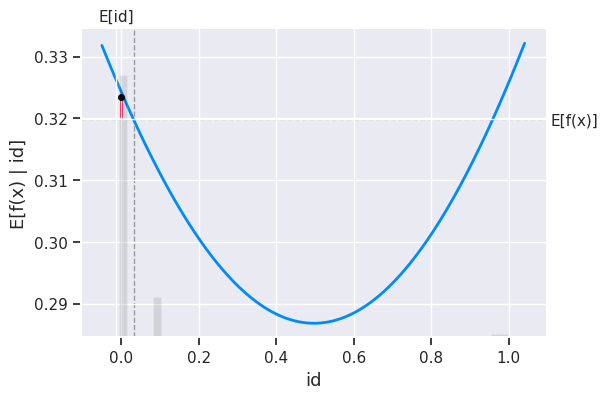

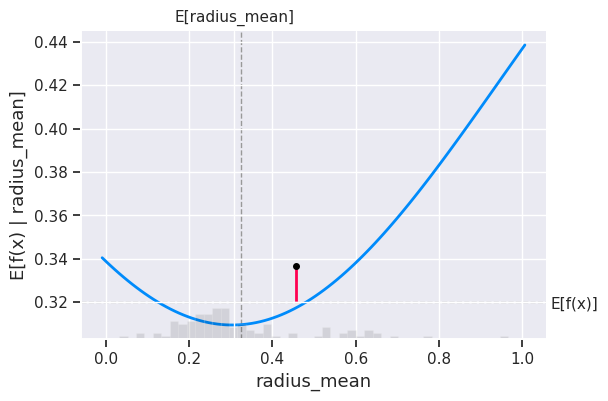

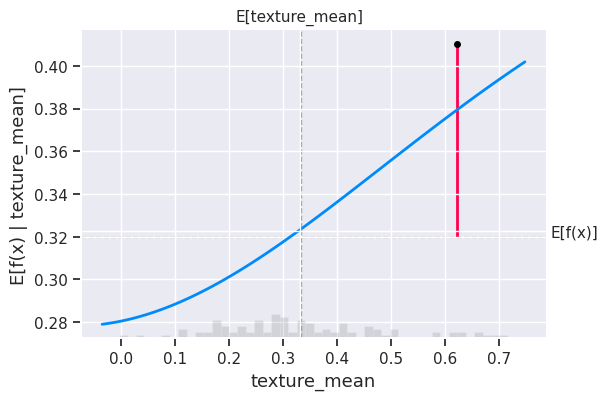

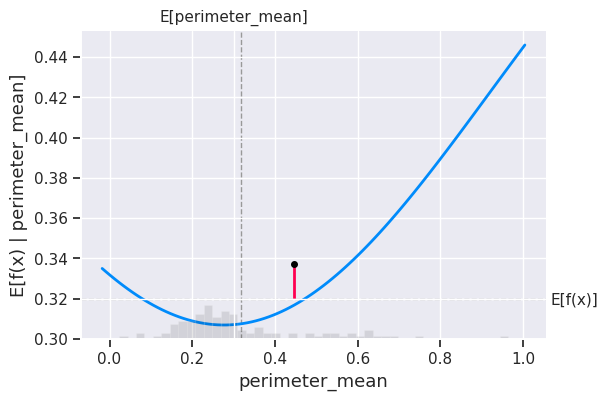

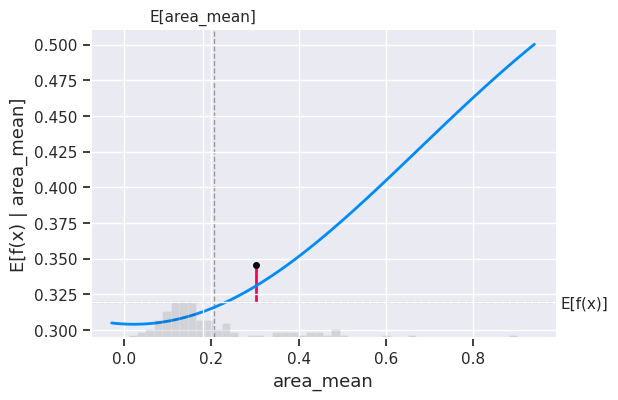

...

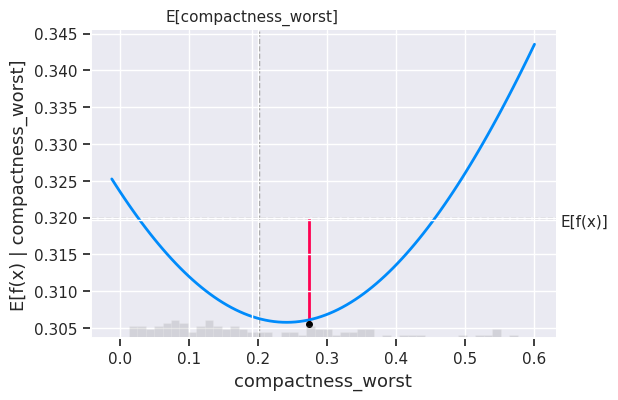

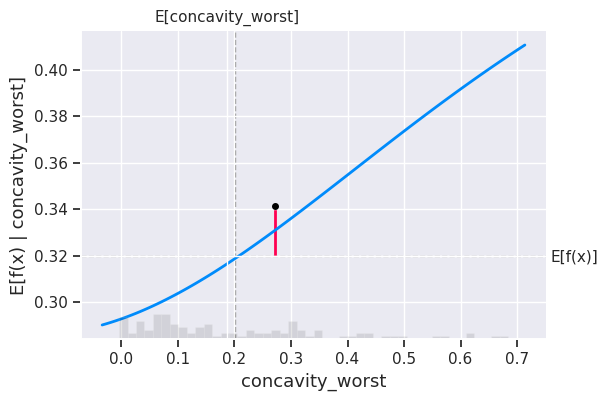

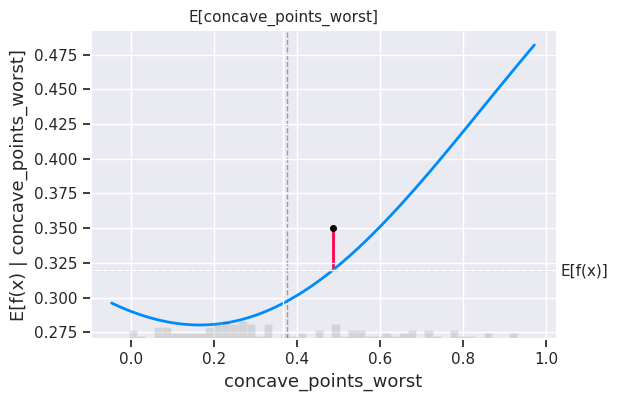

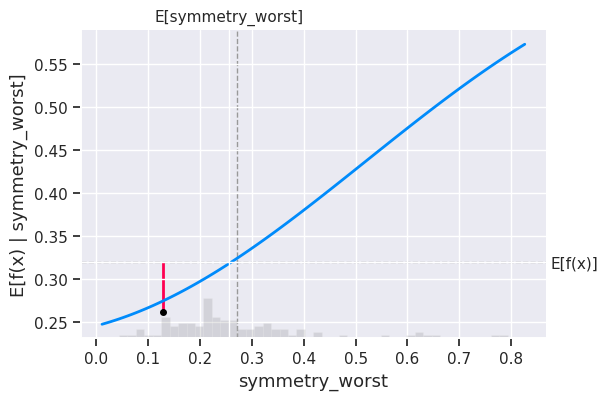

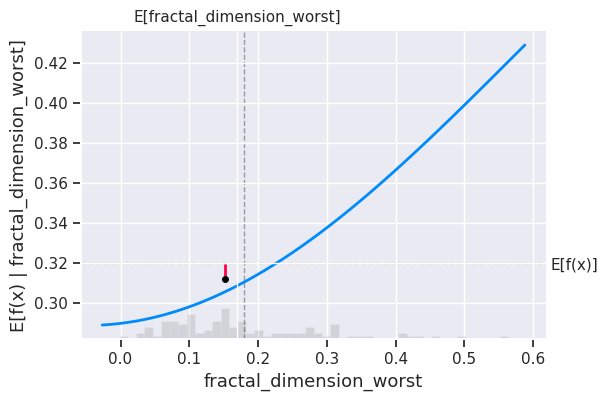

In [162]:
# make a standard partial dependence plot

for i in x_train_100.columns:

    sample_ind = 31
    fig, ax = plt.subplots(figsize=(6, 4))  # set figure size
    shap.partial_dependence_plot(
        i,
        svm_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=svm_shap_values[sample_ind : sample_ind + 1, :],
        ax=ax,  # specify the axis to use for the plot
    )
    plt.show()




# **Interpreting SVM Regressor using SHAP values**


1. This code generates a partial dependence plot for each feature in the __x_train__ dataframe using the SHAP values calculated for the svm regressor model. The resulting plots show the effect of each feature on the model's prediction for a single sample.

2. Let us take a feature of **compactness_mean** --For SVM regressor model the cross is made at approx E[f(x)] **0.32**(Aprox)
3. So as the **compactness_mean** increases the expected value also increases

4. The red line on the plot - When we give a sample as an input (sample_ind = 31) as an input to check the output. By plotting this we can see the difference between the model output from the expected value.



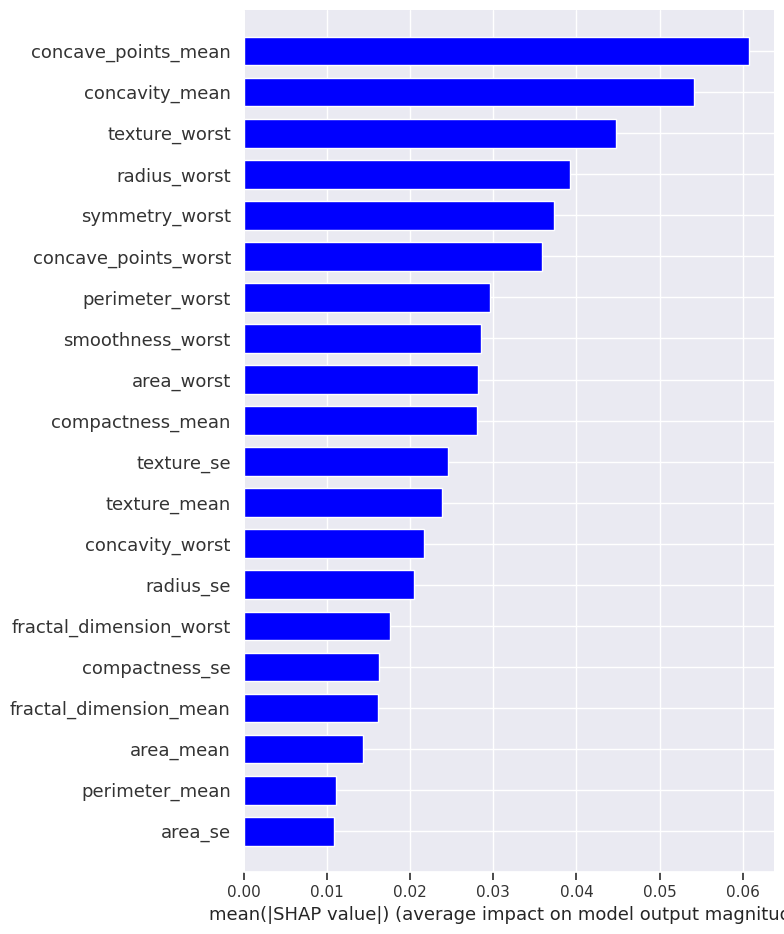

In [163]:
# SHAP variable importance for a Linear Model
shap.summary_plot(svm_shap_values, x_train, plot_type="bar", color="blue")

## **Observations**

The following plot is

SHAP feature importance plot for SVM model
Using the above plot we can come on the conclusion that the **concave_points_mean** is the most important feature, followed by **concavity_mean** and **texture_worst**

# **Interpret the summary plot SVM Model**

Here the features are listed in descending order of their importance. This is one of the easiest ways to analyze an ML model and how the features are affecting the target and to what extent.

The SHAP value plot can show the positive and negative relationships of the predictors with the target variable.
The code shap.summary_plot(shap_values, X_train)produces the following plot:

This plot is made of all the dots in the train data. It delivers the following information:

1. __Feature importance:__ Variables are ranked in descending order.
2. __Impact:__ The horizontal location shows whether the effect of that value is associated with a higher or lower prediction.
3. __Original value:__ Color shows whether that variable is high (in red) or low (in blue) for that observation.
4. __Correlation:__ A high level of the __“texture_worst”__ content has a low and positive impact on the target variable(in our case its diagnosis).
 The “high” comes from the red color, and the “positive” impact is shown on the X-axis. Similarly, we will say the __“symmetry_worst”__ is positively correlated with the target variable. Which means that the high levels of **symmetry_worst** will have high chances of person prone to disease


This visualization is very useful when it comes to interpreting how our model is working.

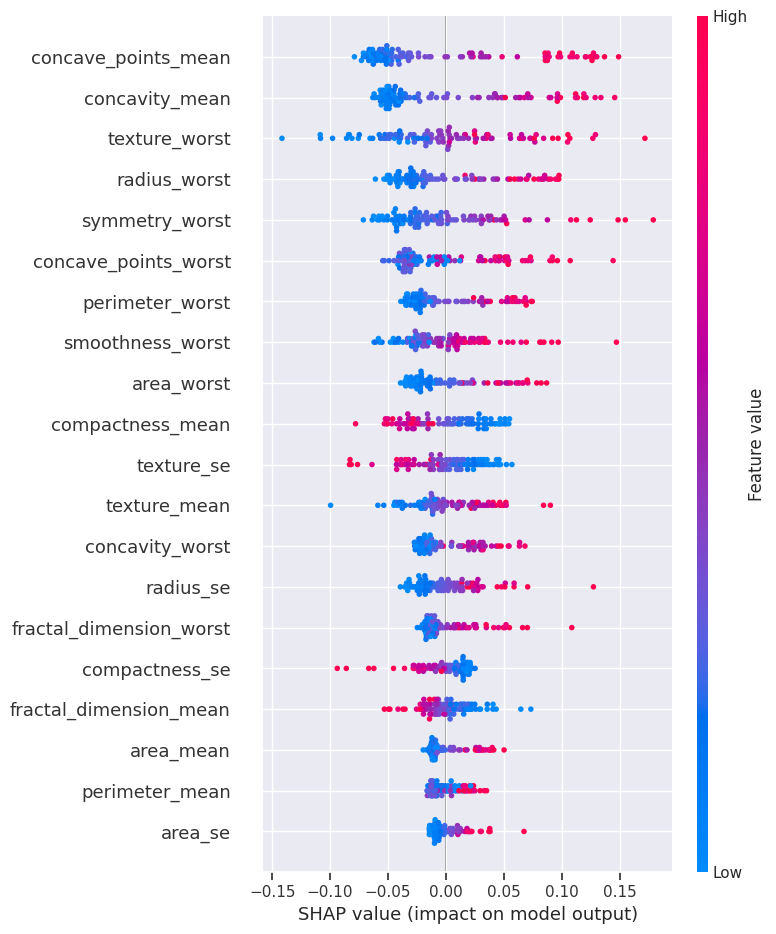

In [164]:
# SHAP summary for Linear Model
shap.summary_plot(svm_shap_values, x_train_100)

# **SHAP Analysis for Linear and Tree-Based Models**

- __SHAP (SHapley Additive exPlanations)__ is a method for interpreting the output of machine learning models, and it provides insights into the contribution of each feature to the model's prediction for a particular instance. SHAP values measure the impact of each feature on the model's output for a particular instance, and they provide a unified measure of feature importance that is consistent across different models.

- For __linear models__, SHAP values can be calculated using the coefficients of the model as written in code below. The SHAP value for a particular feature is calculated as the product of the coefficient for that feature and the difference between the prediction with that feature included and the prediction with that feature excluded.

- For __tree-based models__, SHAP values can be calculated using the tree structure and the feature values of a particular instance. The SHAP value for a particular feature is calculated as the difference between the average prediction of the model with that feature present in the tree and the average prediction of the model with that feature absent in the tree, over all possible subsets of features.

PermutationExplainer explainer: 513it [00:24, 12.26it/s]                         


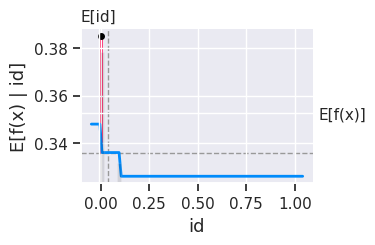

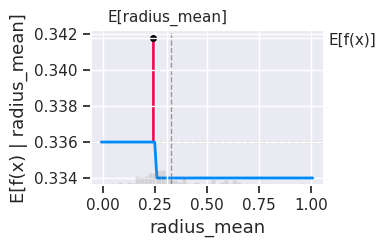

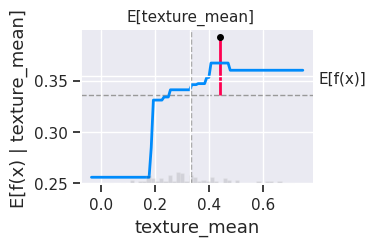

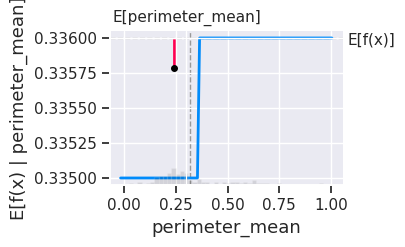

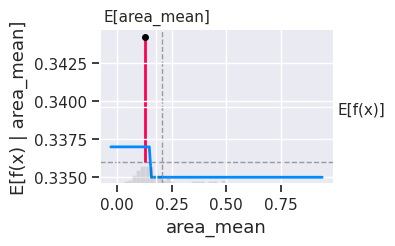

...

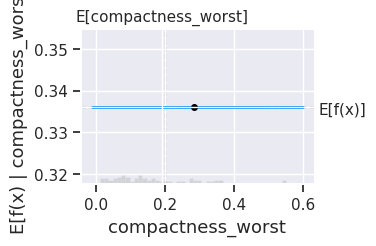

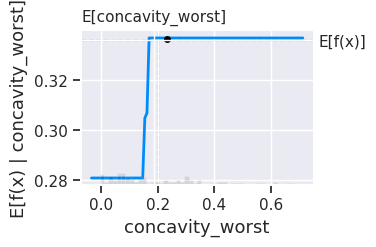

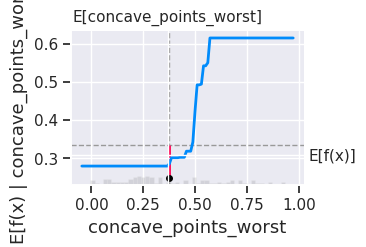

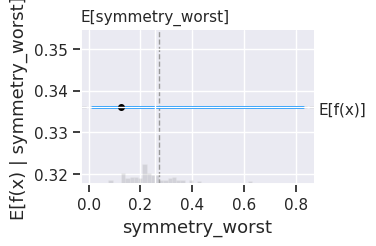

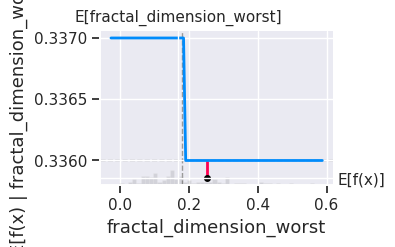

In [165]:
   #This code is performing a SHAP partial dependence plot for a Tree Model
tree_explainer = shap.Explainer(tree_model.predict, x_train_100)
tree_shap_values = tree_explainer(x_train)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 31
    fig, ax = plt.subplots(figsize=(3,2)) # Create a new figure with the desired size
    shap.partial_dependence_plot(
        i,
        tree_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
        ax=ax
    )

## **Analysis**
1. This code generates a partial dependence plot for each feature in the __x_train__ dataframe using the SHAP values calculated for the tree-based model. The resulting plots show the effect of each feature on the model's prediction for a single sample.

2. Let us take a feature of **compactness_mean** --For Tree-based model the cross is made at approx E[f(x)] **0.336**(Aprox)
3. So as the **compactness_mean** increases the expected value also increases

4. The red line on the plot - When we give a sample as an input (sample_ind = 31) as an input to check the output. By plotting this we can see the difference between the model output from the expected value.


__Note:__The tree_model object is assumed to be a tree-based model, such as a decision tree, random forest, or gradient boosting machine. Tree-based models have a different internal structure compared to linear models, and SHAP values for tree-based models are calculated differently. The tree_explainer object is designed to handle these differences and calculate SHAP values for tree-based models.

PermutationExplainer explainer: 513it [00:19, 10.29it/s]                         


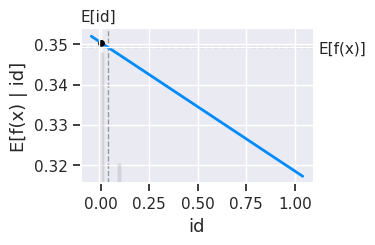

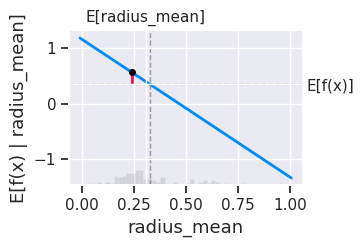

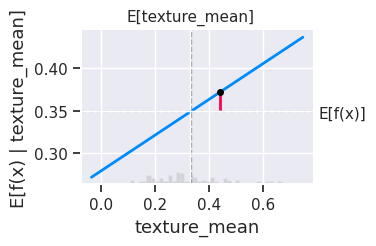

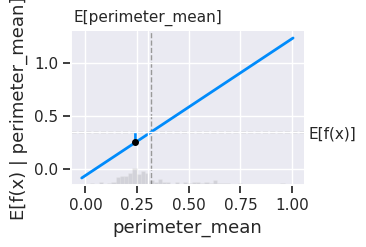

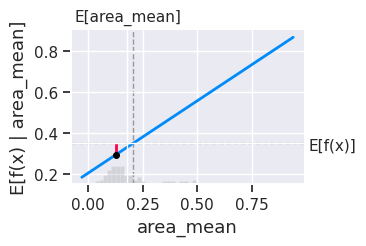

...

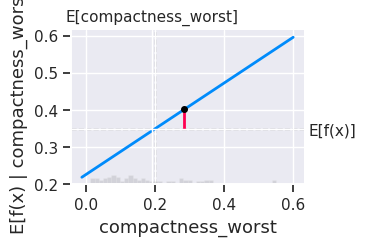

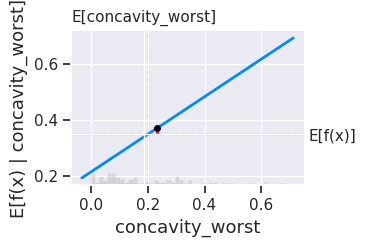

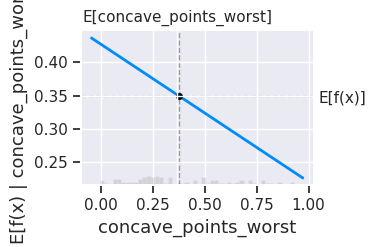

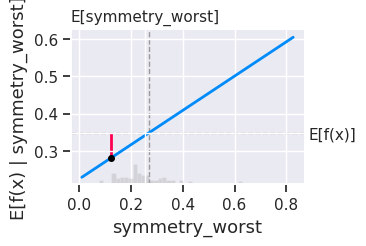

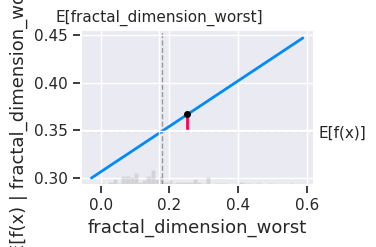

In [166]:
import matplotlib.pyplot as plt
#This code is performing a SHAP partial dependence plot for a linear model

linear_explainer = shap.Explainer(linear_model.predict, x_train_100)
linear_shap_values = linear_explainer(x_train)

for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 31
    fig, ax = plt.subplots(figsize=(3,2)) # Create a new figure with the desired size
    shap.partial_dependence_plot(
        i,
        linear_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
        ax=ax # Pass the axes of the new figure to the function
    )

# **Analysis:**
1. The above code generates a partial dependence plot for each feature in the __x_train__ dataframe using the SHAP values calculated for the linear model. The resulting plots show the effect of each feature on the model's prediction for a single sample(I have taken sample number 31)

2. Since the focus is on generating partial dependence plots for each feature to visualize the marginal effect of each feature on the model's prediction, ICE plots are not necessary and can be computationally expensive to generate.

3. Here the x-axis is the feature and the y-axis is the output as we vary the feature. The grey histogram is the distribution of variables in the dataset and the cross made by E[Feature], E[f(x)] is the expected values.

4. Let us take a feature of symmetry_mean
     -- For the linear model the cross is made at approx E[f(x)] 0.349(Approx)
     
5. So as the symmetry_mean increases the expected value also increases

6. The red line on the plot - When we give a sample as an input (sample_ind = 31) as an input to check the output. By plotting this we can see the difference between the model output from the expected value.

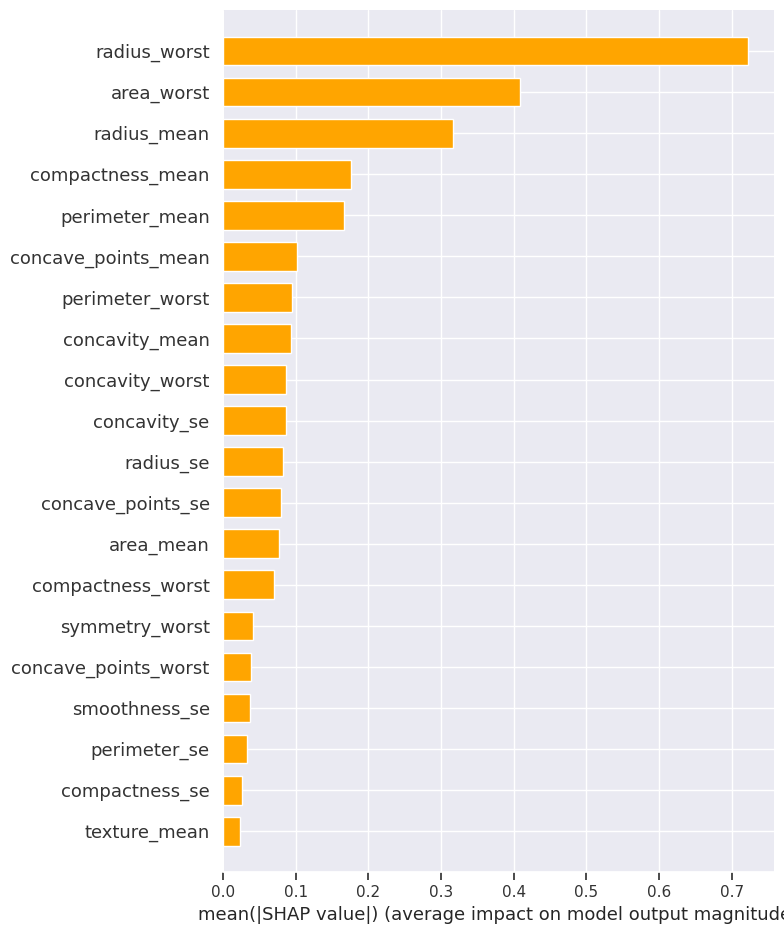

In [167]:
# SHAP variable importance for a Linear Model
shap.summary_plot(linear_shap_values, x_train, plot_type="bar", color="orange")

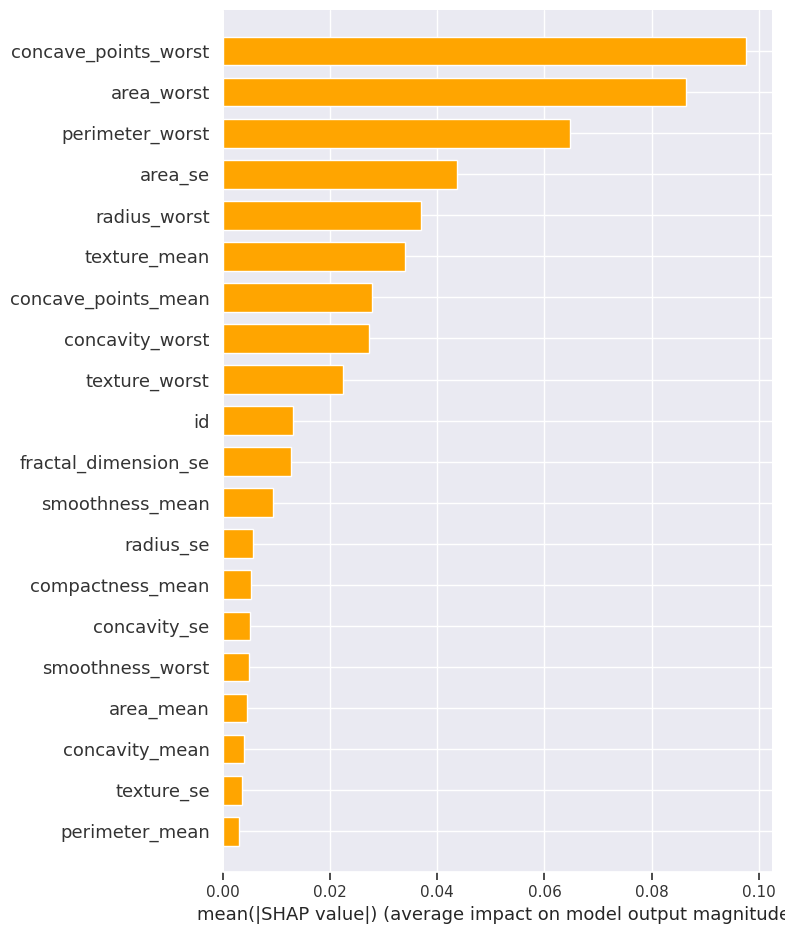

In [168]:

# SHAP variable importance for Tree based model
shap.summary_plot(tree_shap_values, x_train, plot_type="bar", color="orange")

## **Observations:**
- A variable importance plot lists the most significant variables in descending order.
- The top variables contribute more to the model than the bottom ones and thus have high predictive power.
- The shap.summary_plot function with plot_type=”bar” lets you produce the variable importance plot.

## **Interpret the summary plot for the Linear and Tree-based model**
The SHAP value plot can show the positive and negative relationships of the predictors with the target variable. The code produces the following plot

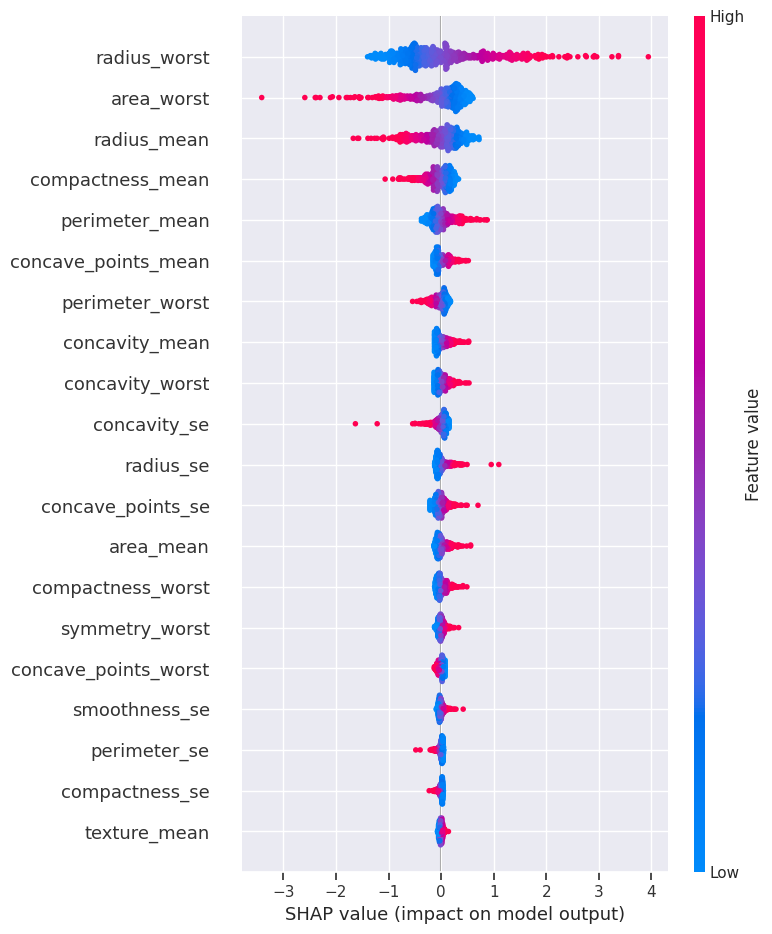

In [169]:

# SHAP summary for Linear Model
shap.summary_plot(linear_shap_values, x_train)

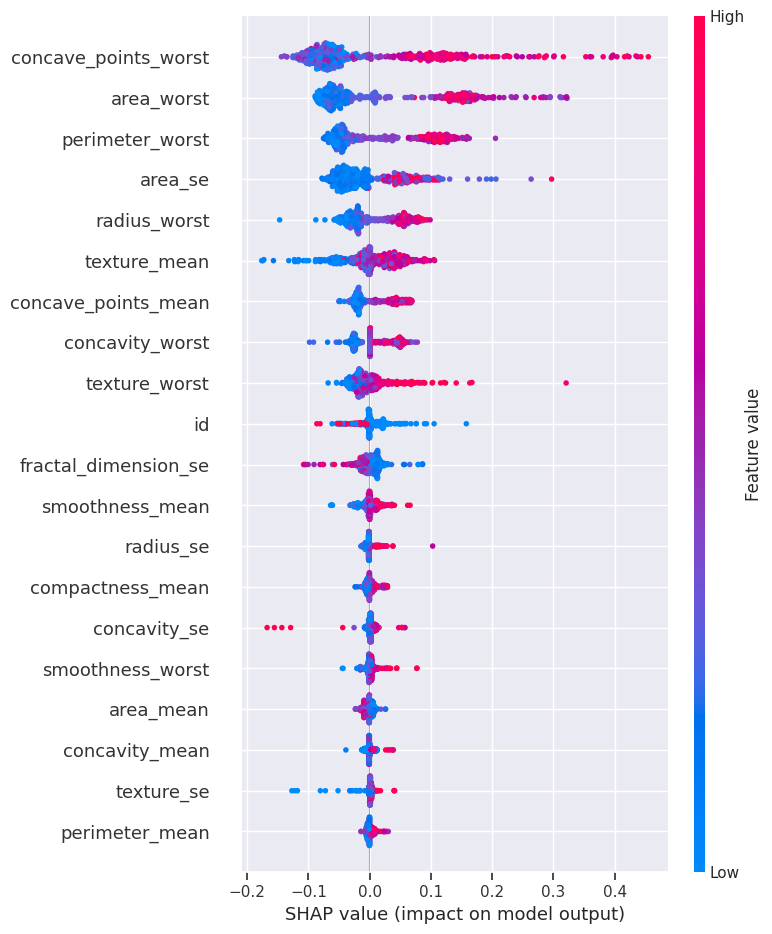

In [170]:
# SHAP summary for Tree Model
shap.summary_plot(tree_shap_values, x_train)

# Observations:
The SHAP value plot can show the positive and negative relationships of the predictors with the target variable.
The code shap.summary_plot(shap_values, X_train)produces the following plot:

This plot is made of all the dots in the train data. It delivers the following information:

1. __Feature importance:__ Variables are ranked in descending order.
2. __Impact:__ The horizontal location shows whether the effect of that value is associated with a higher or lower prediction.
3. __Original value:__ Color shows whether that variable is high (in red) or low (in blue) for that observation.
4. __Correlation:__ A high level of the __“radius_worst”__ content has a low and positive impact on the target variable(in our case its diagnosis).Which means that the person with appropriate radius of breast's orientation is less prone to Breast Cancer disease. The “high” comes from the red color, and the “positive” impact is shown on the X-axis.
5. Similarly, we will say the **“concave_points_worst”** is positively correlated with the target variable. Which means that the high levels will have high chances of person prone to disease


Note: The columns with the worst suffix (like radius_worst, texture_worst, etc.) provide the worst or largest mean value for each feature, derived from an average of three largest values.



## **Interpreting SHAP dependence plot for Linear and Tree-based model**

Lets visuilize SHAP dependence plot. A partial dependence plot shows the marginal effect of one or two features on the predicted outcome of a machine learning model . It tells whether the relationship between the target and a feature is linear, monotonic or more complex.

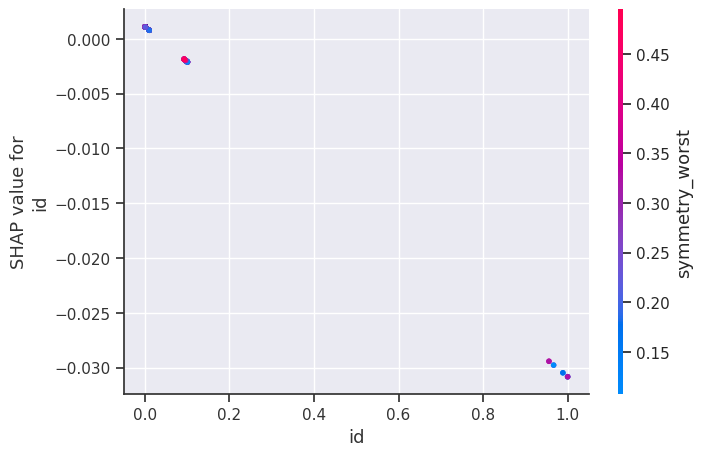

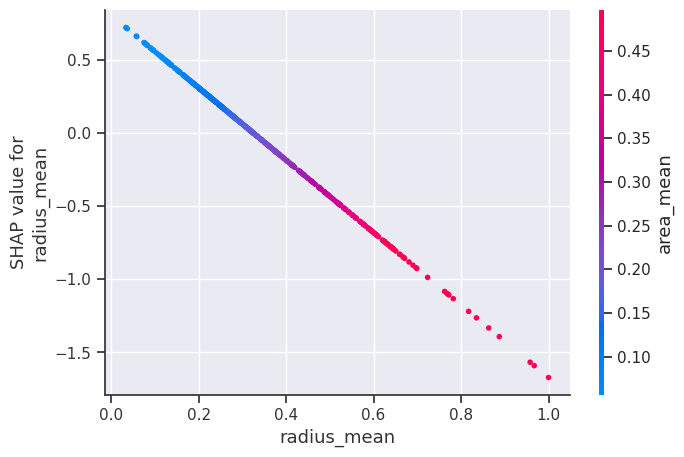

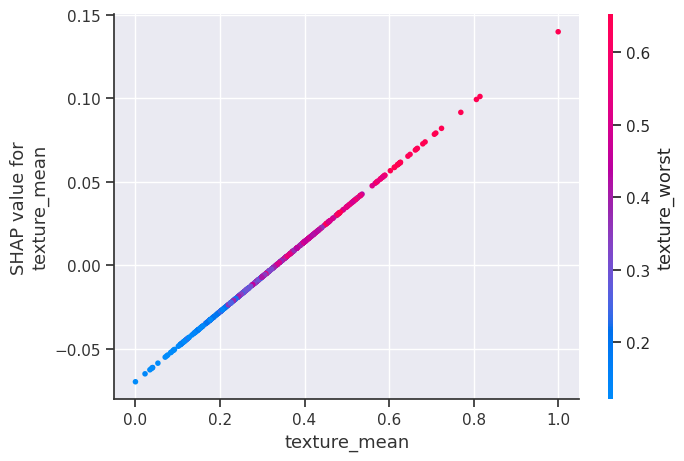

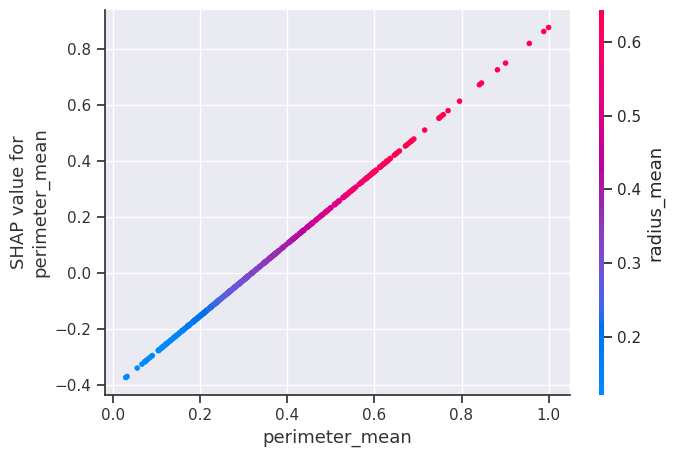

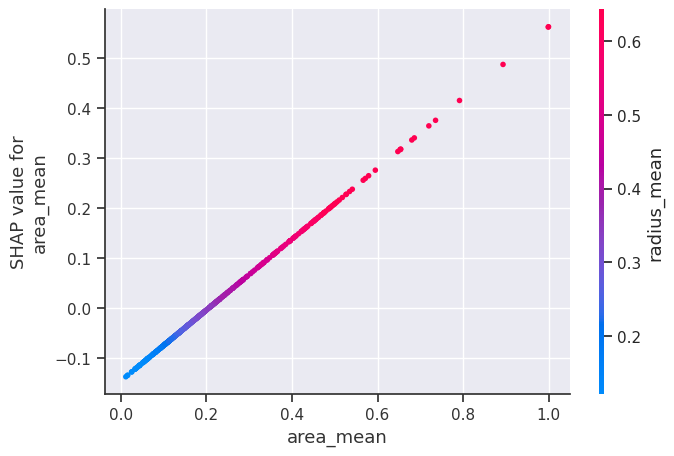

...

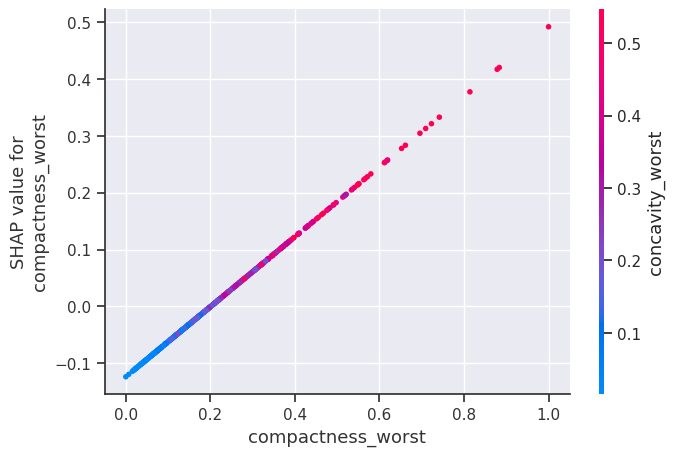

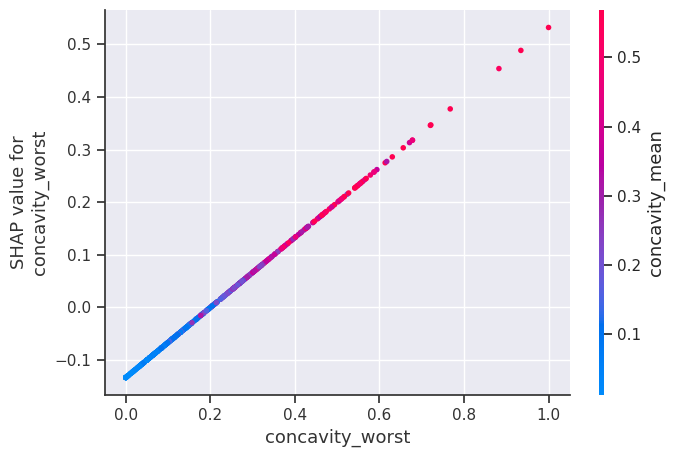

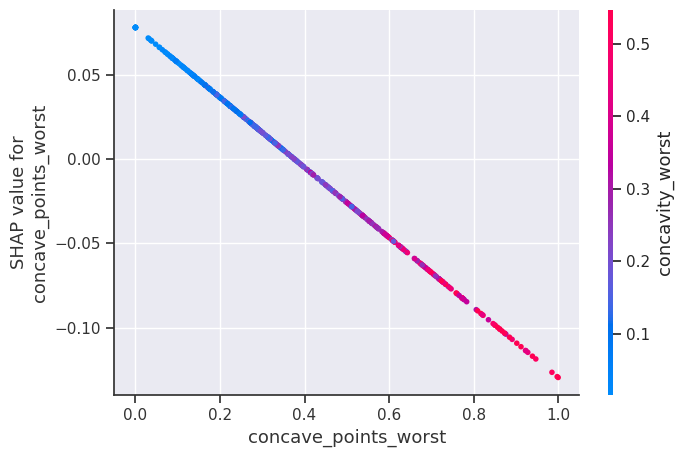

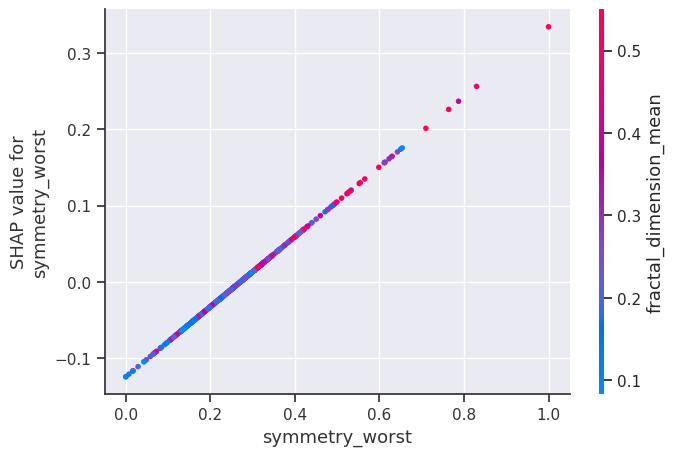

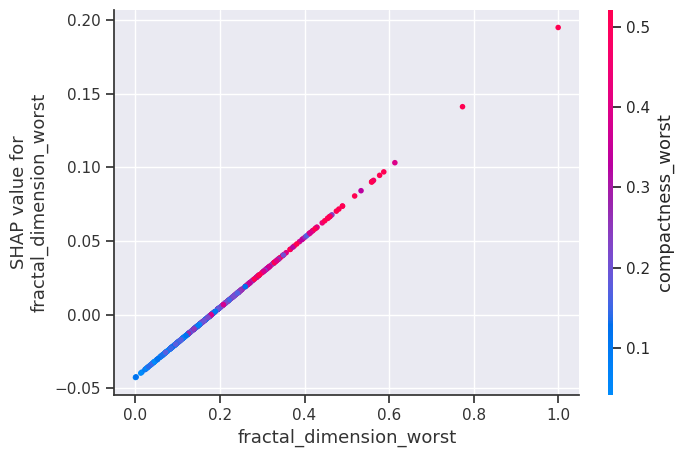

In [171]:
# SHAP partial dependence plot for linear model
for i in x_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, x_train)

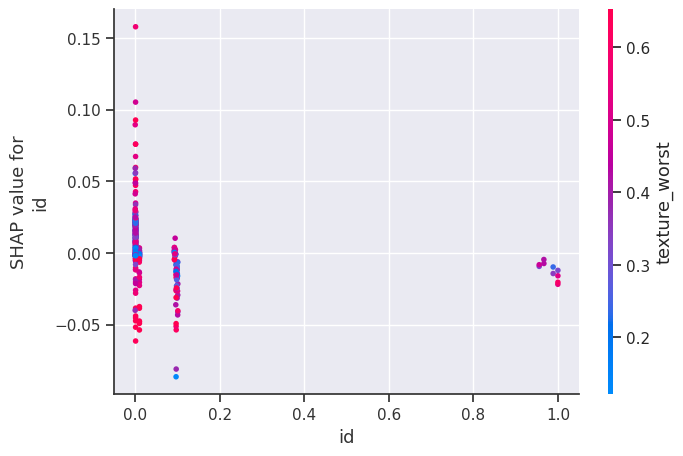

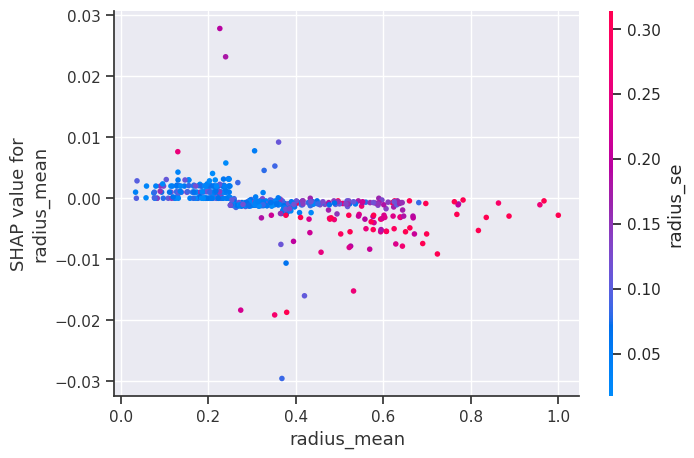

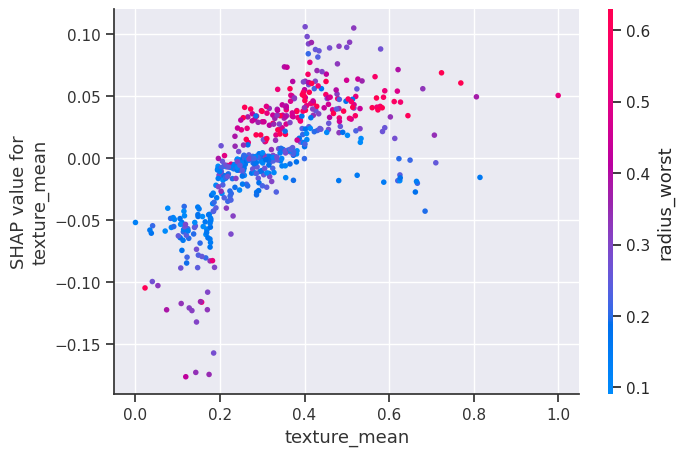

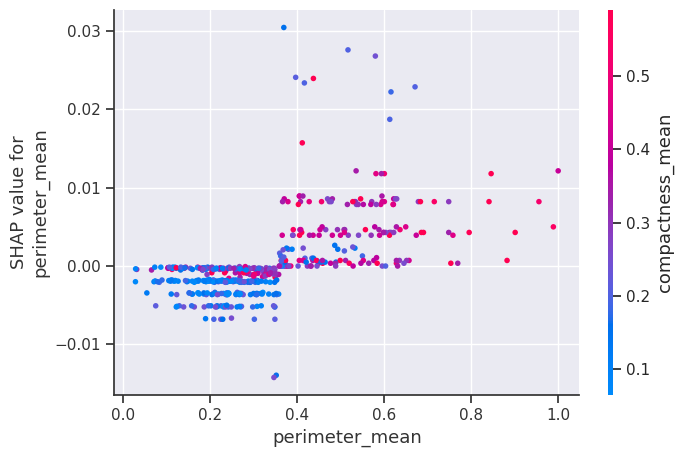

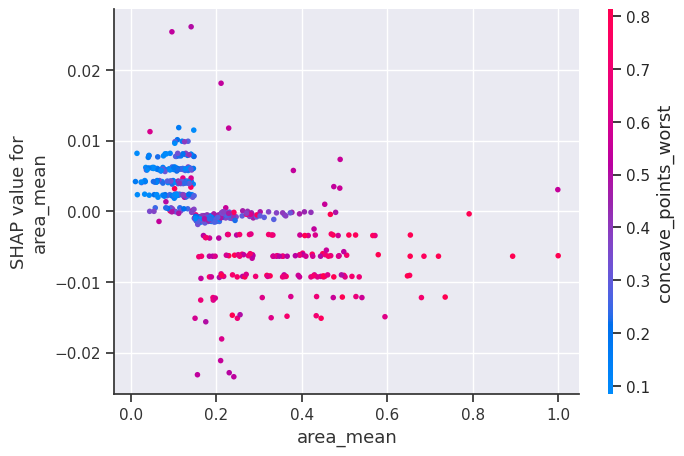

...

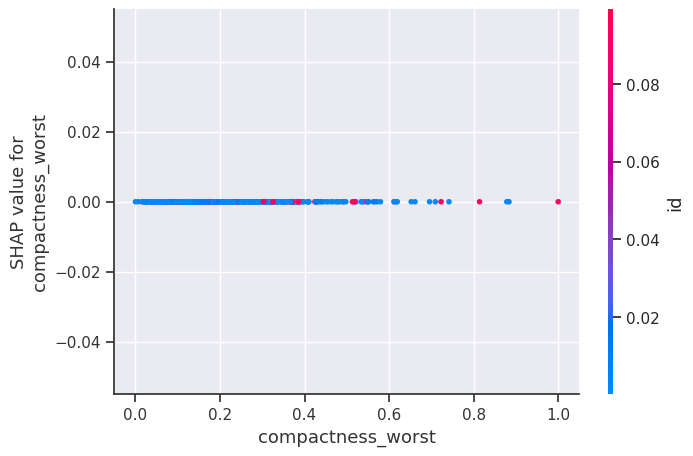

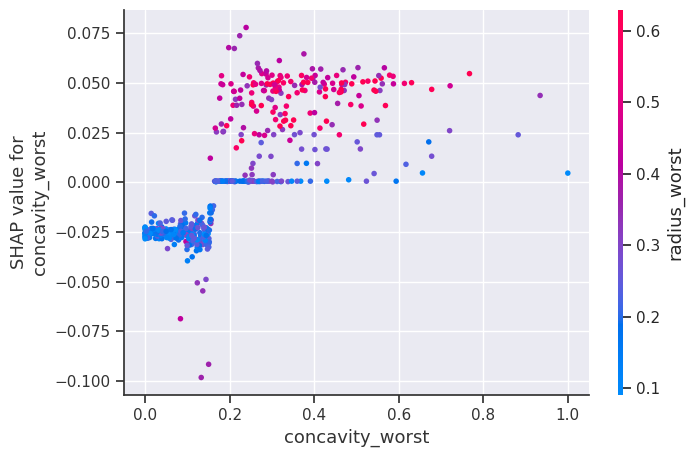

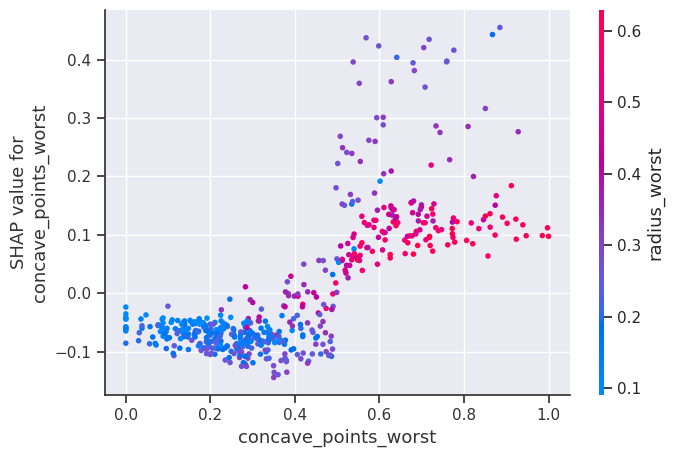

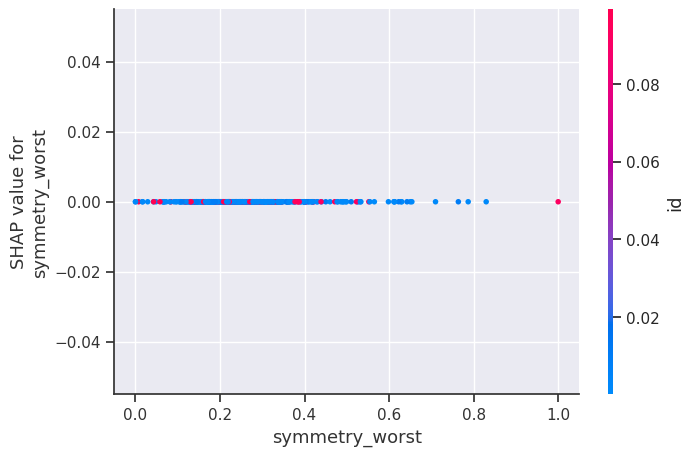

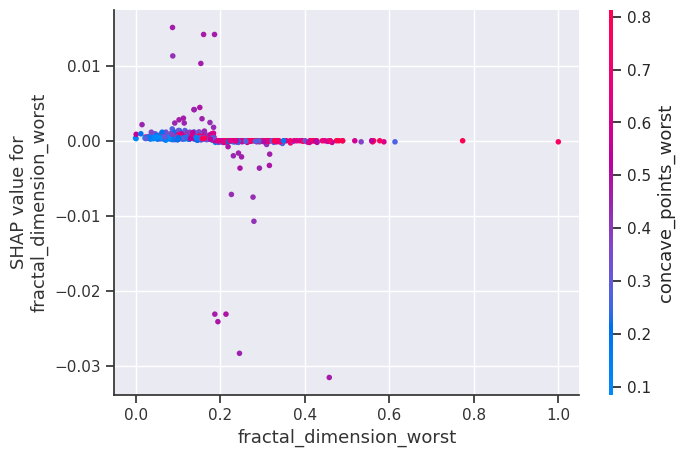

In [172]:
# SHAP partial dependence plot for a tree based model
for i in x_train.columns:
    shap.dependence_plot(i, tree_shap_values.values, x_train)

## **Observations**

- To create a dependence plot, we only need single line of code: shap.dependence_plot(“Feature”, shap_values, X_train). Here I have iterated over all 31 features and plotted the graphs.
- The function here automatically includes another variable that your chosen variable interacts most with.
- The plot shows there is an approximately linear trend between “**radius_mean**” and the target variable, and “**radius_mean**” interacts with “**radius_se**” frequently.
- Suppose if we want to know “**radius_mean**”, as well as the variable that it interacts with the most, you can do shap.dependence_plot(“**radius_mean**”, shap_values, X_train). The output will be same as my 2nd figure of linear model.


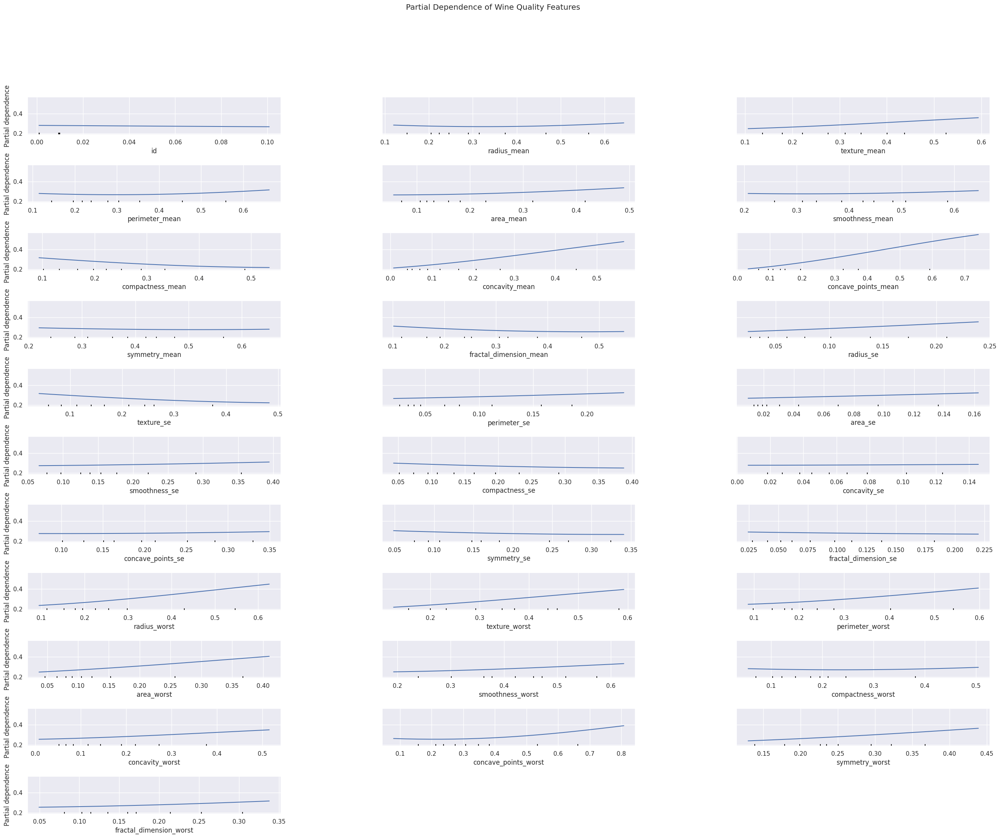

In [192]:
import matplotlib.pyplot as plt
from sklearn.inspection import PartialDependenceDisplay

# Replace 'svm_model' with your actual model
# Assuming 'x_test' is your test dataset and contains the features you want to analyze

# Generating the Partial Dependence Plot
PartialDependenceDisplay.from_estimator(
    svm_model, x_test, x_test.columns, n_jobs=3, grid_resolution=20
)

# Adjust figure settings
fig = plt.gcf()
fig.set_size_inches(32, 24)  # Set the size of the figure
fig.suptitle("Partial Dependence of Wine Quality Features")
fig.subplots_adjust(wspace=0.4, hspace=0.8)

# Display the plot
plt.show()




## **Interpreting AutoML's best model with tuned hyperparameters**



# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

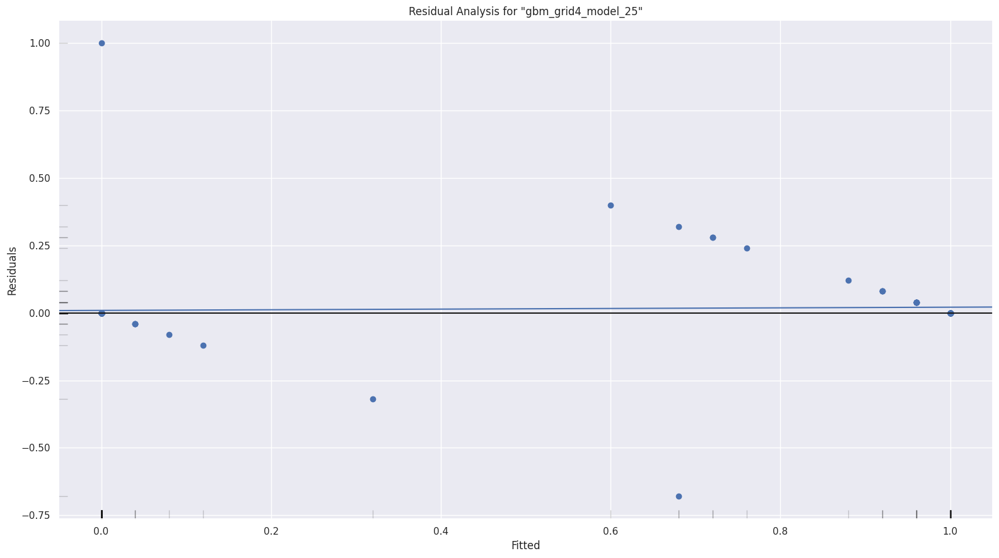

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

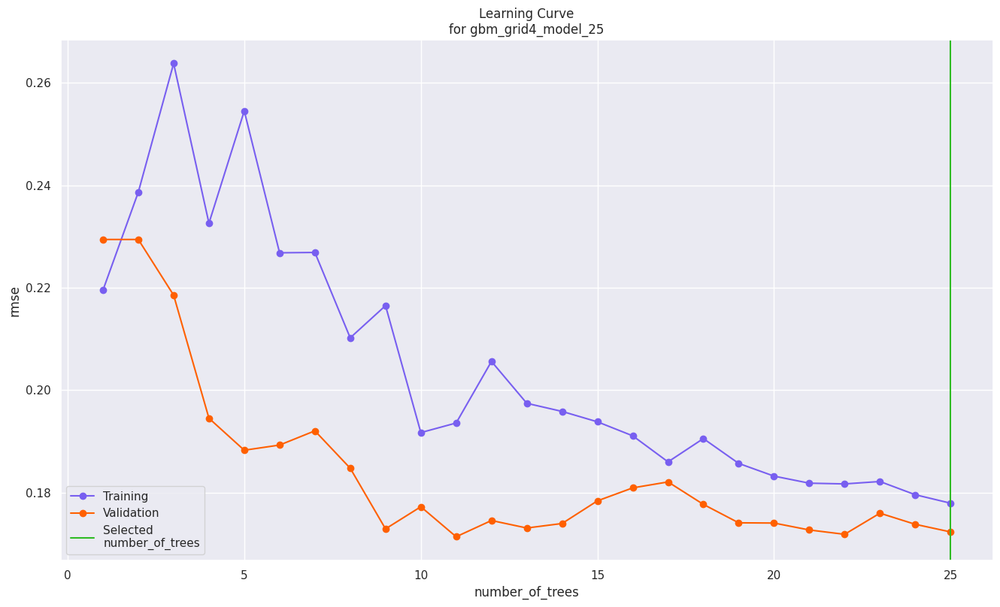

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

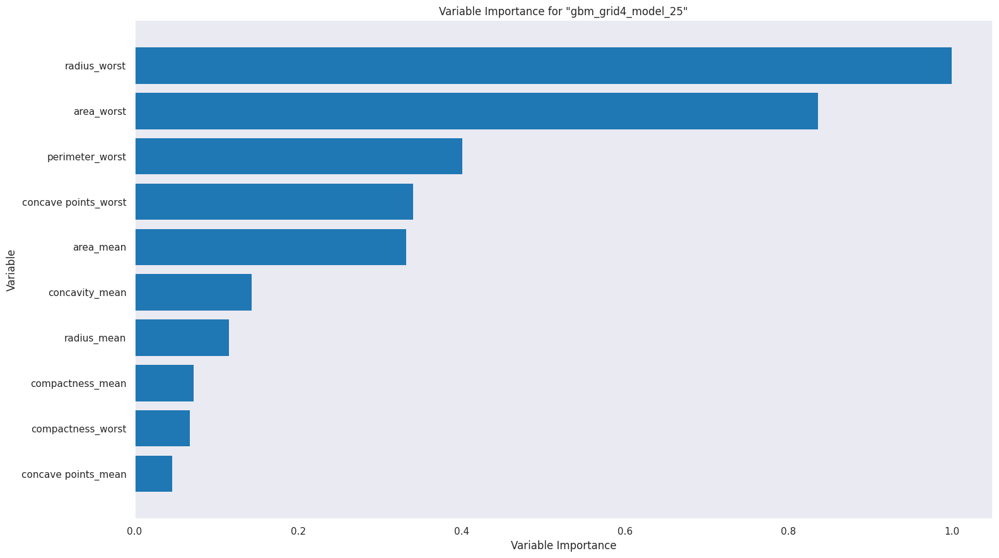

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

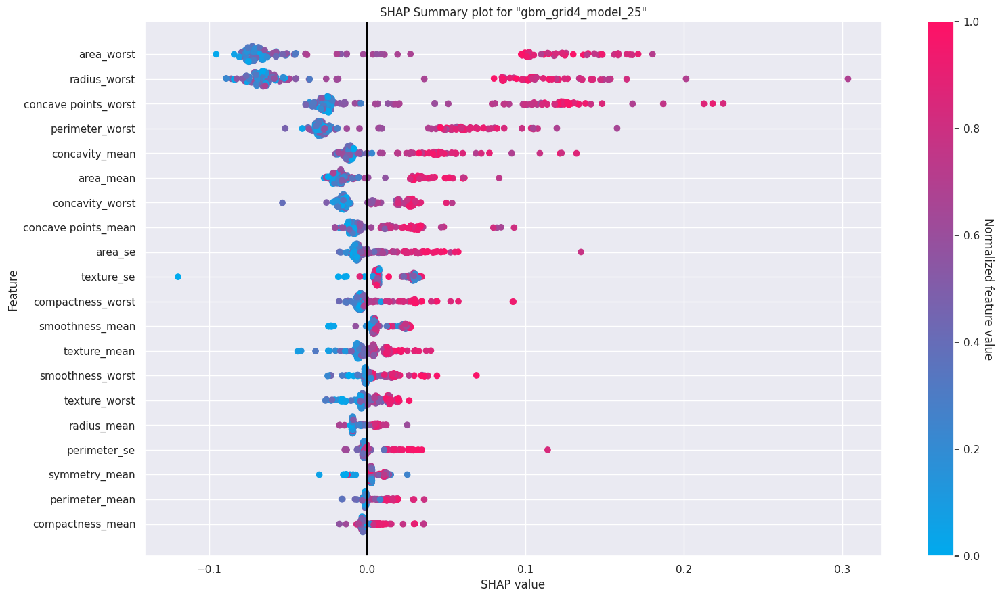

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

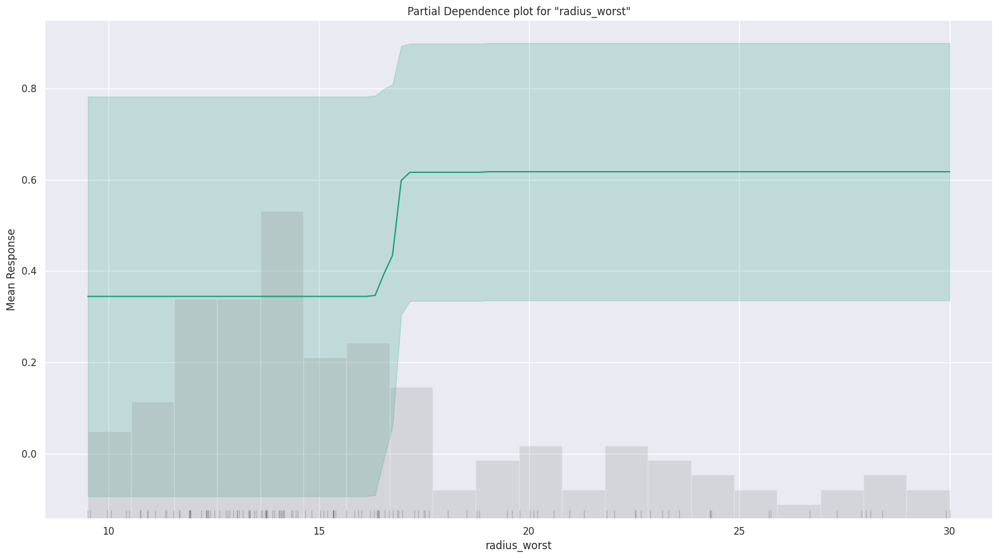

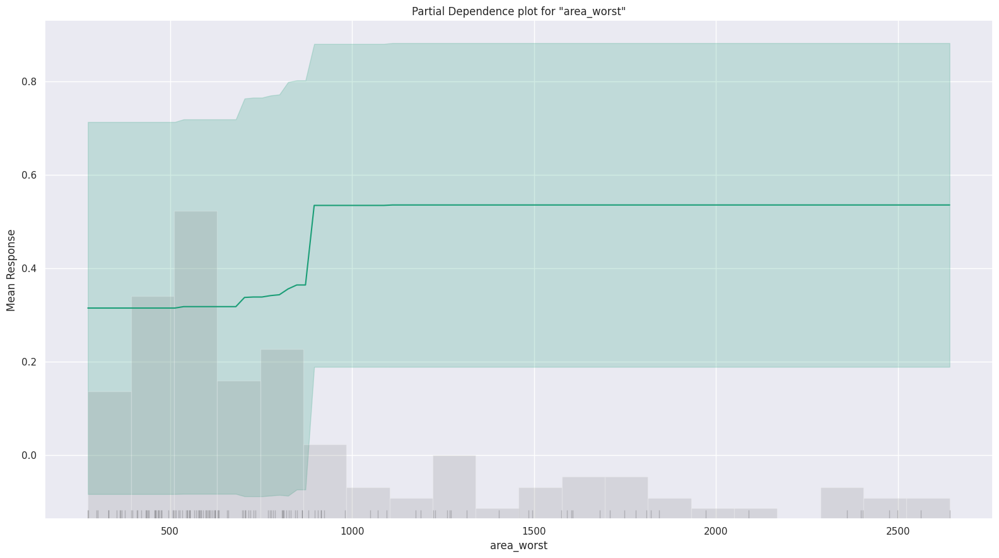

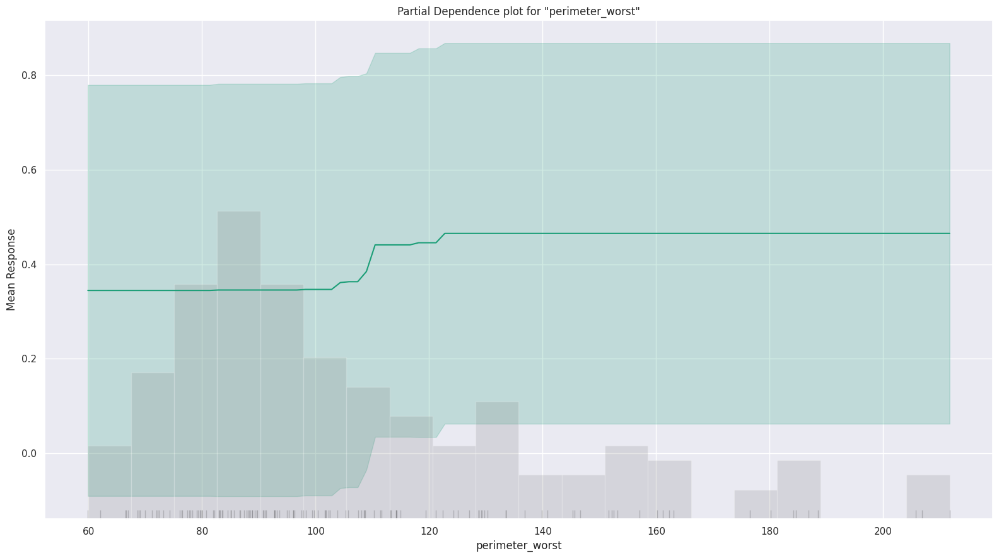

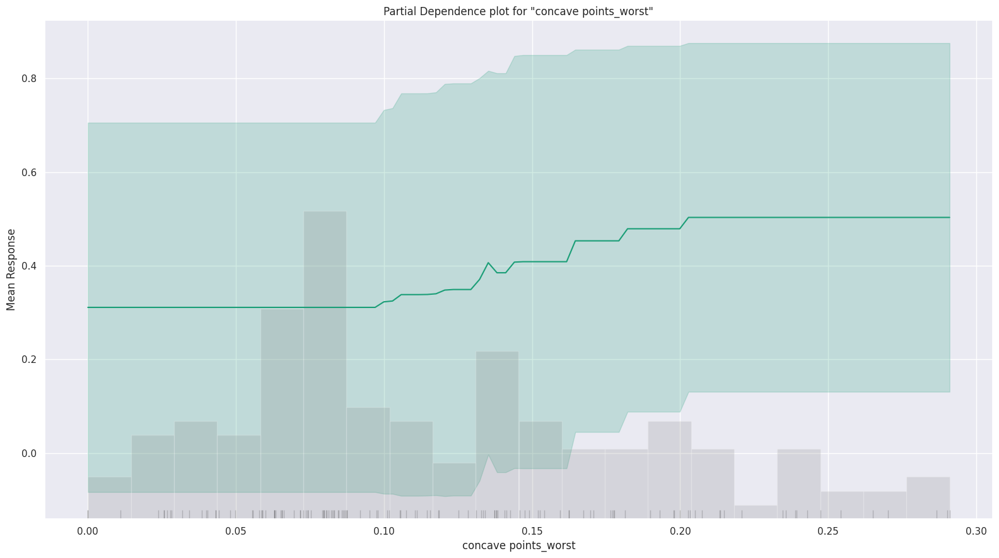

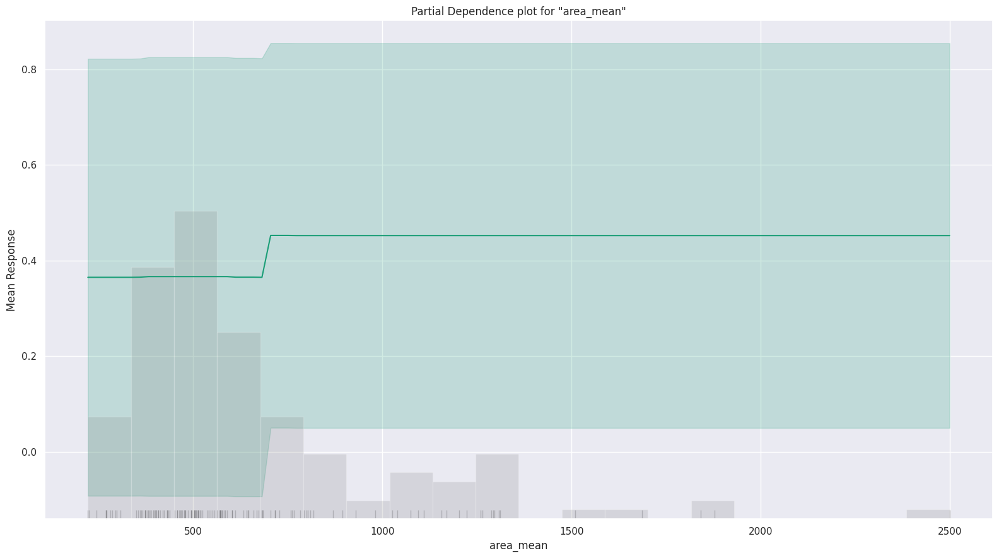

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

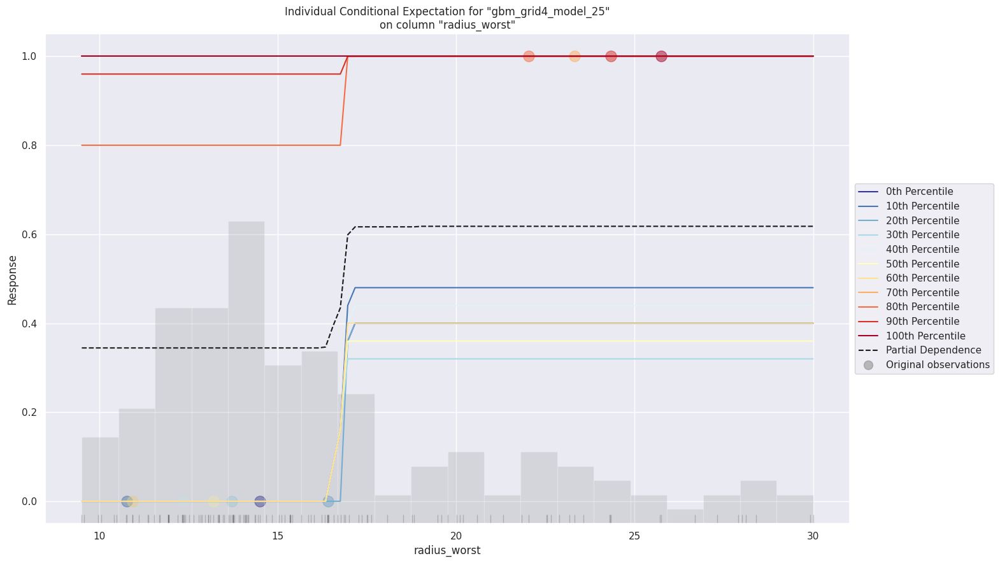

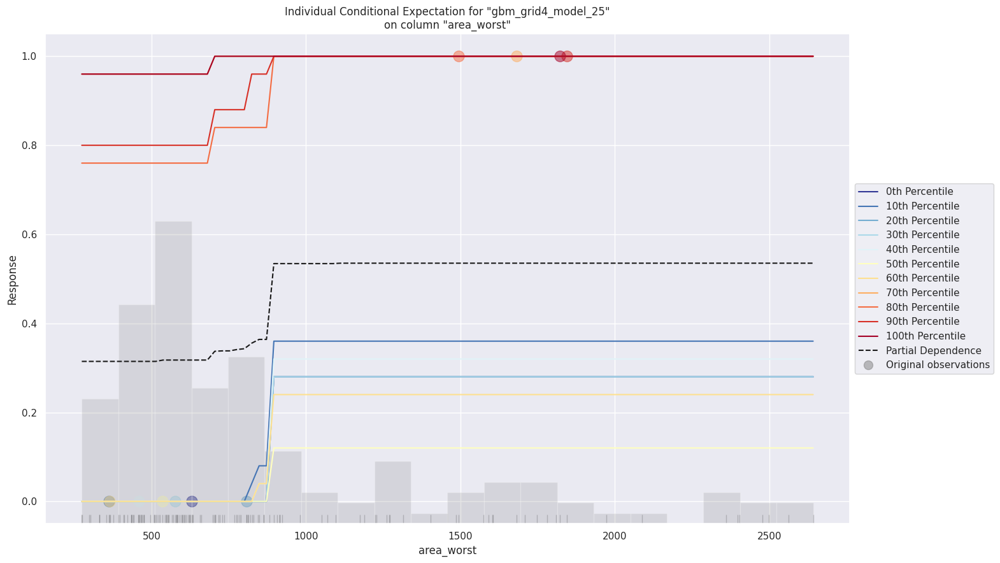

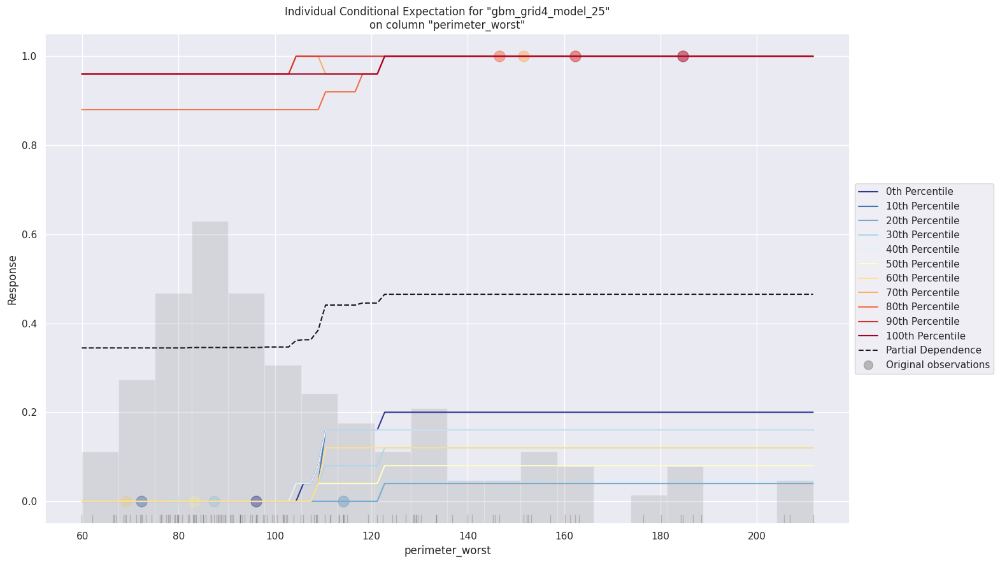

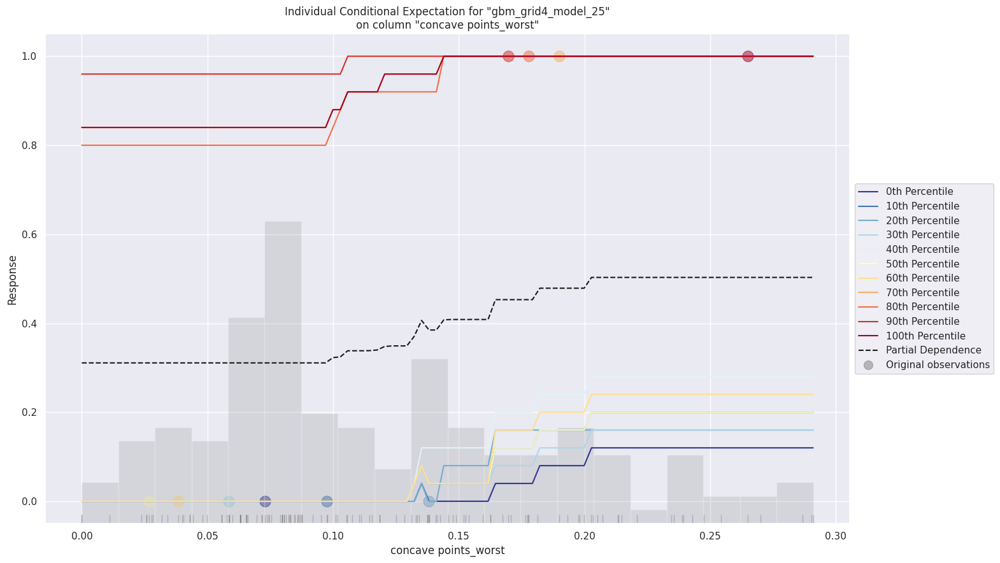

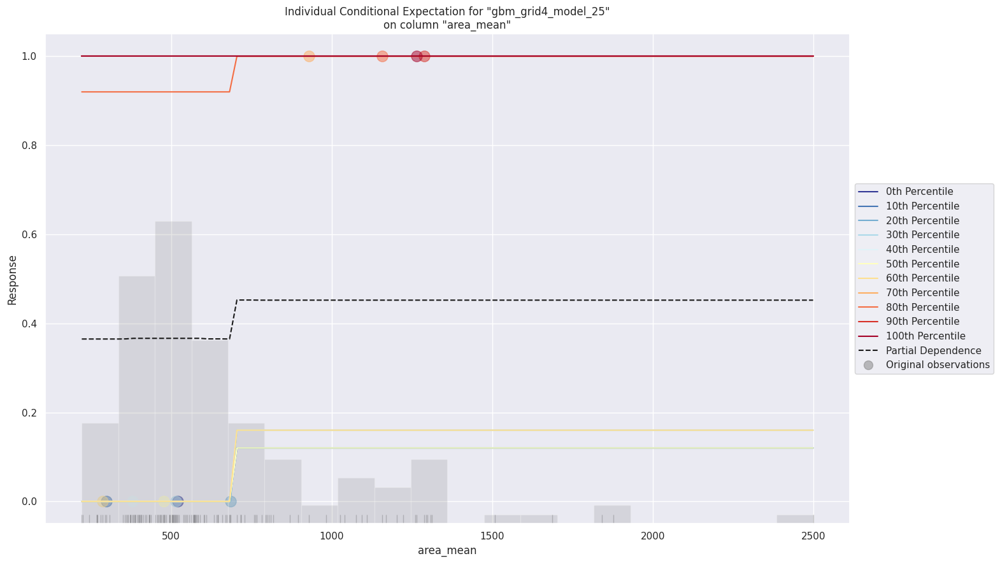

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

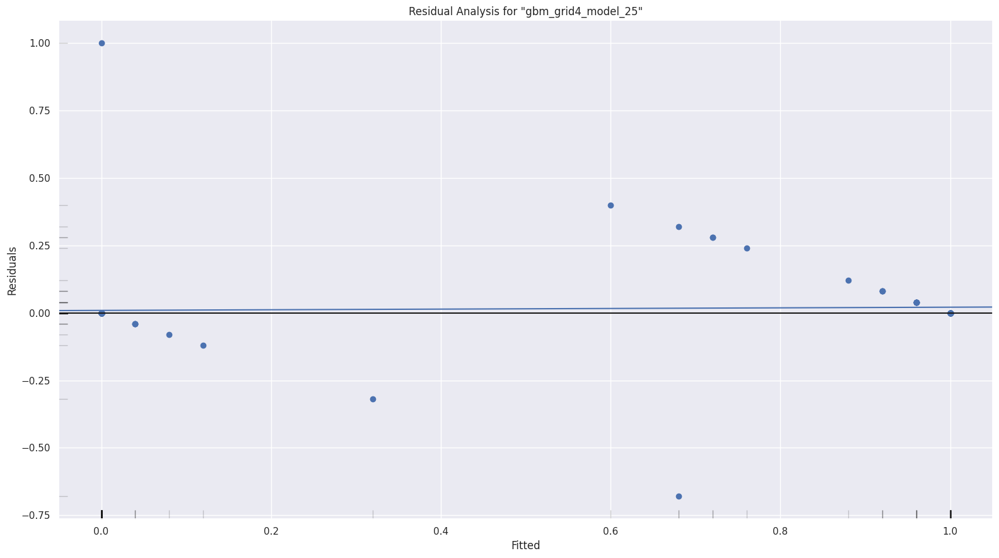

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

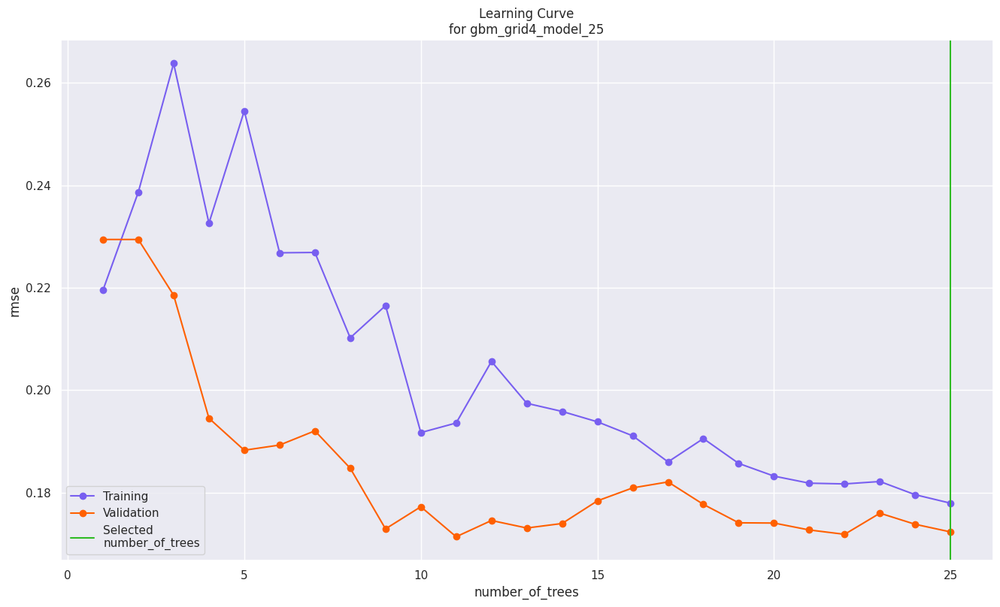

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

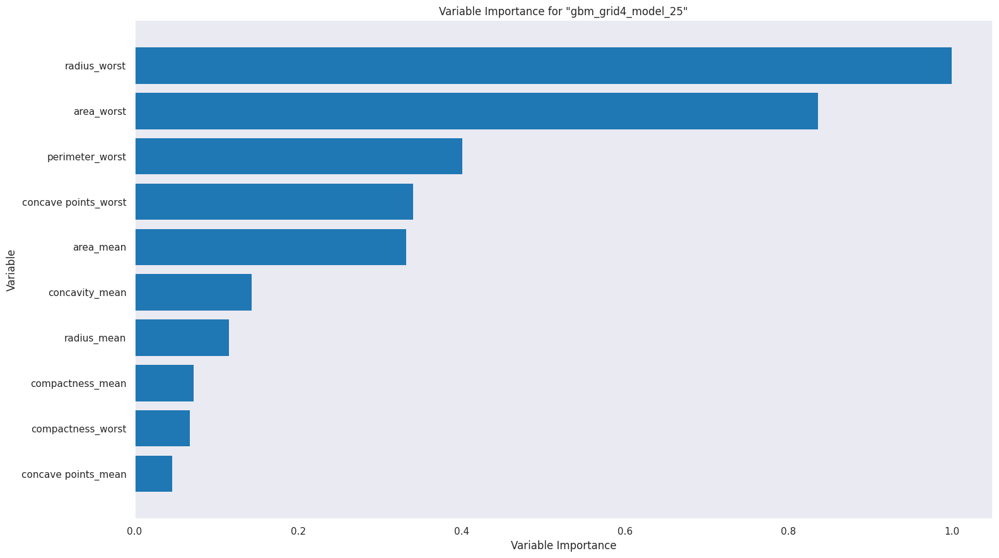

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

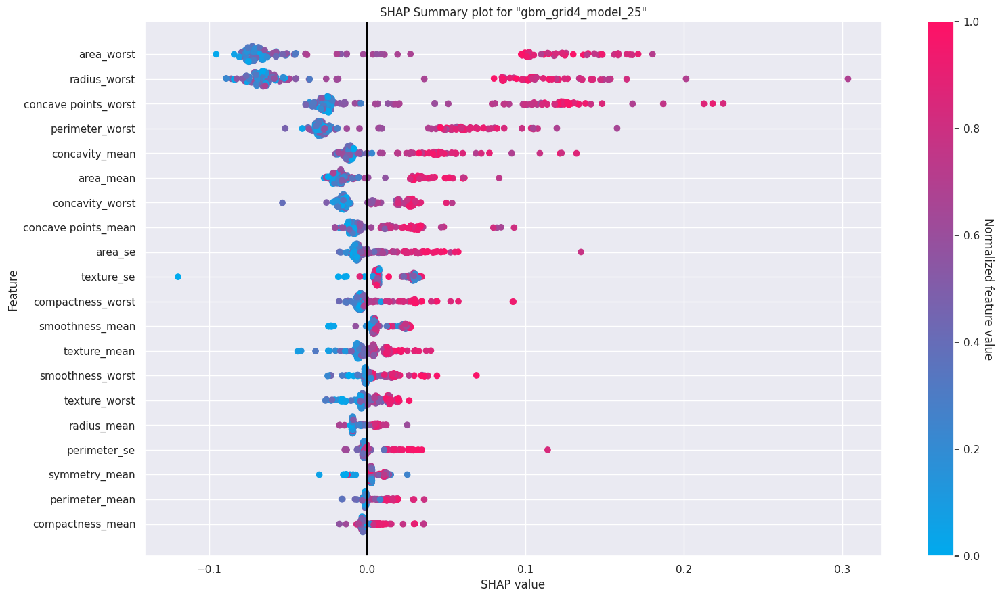

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

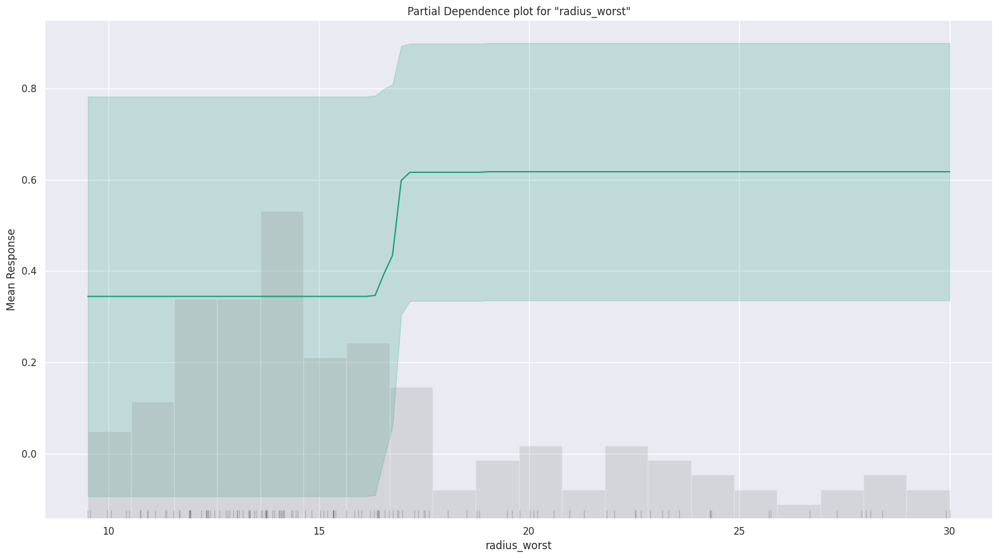

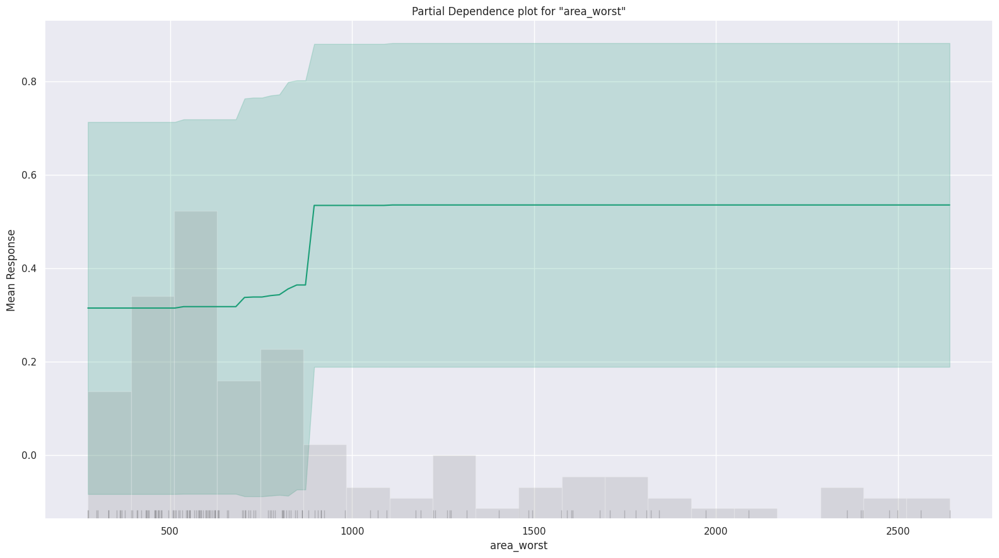

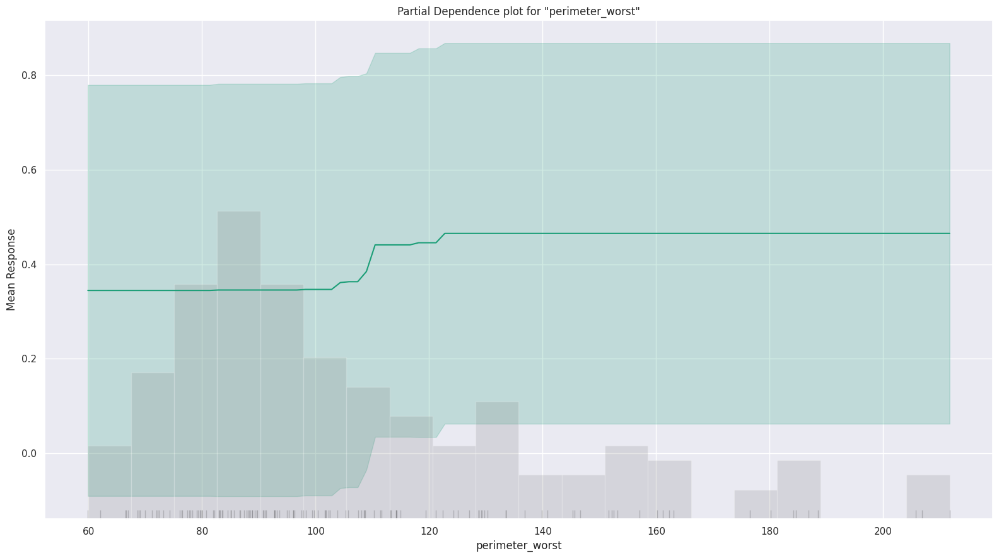

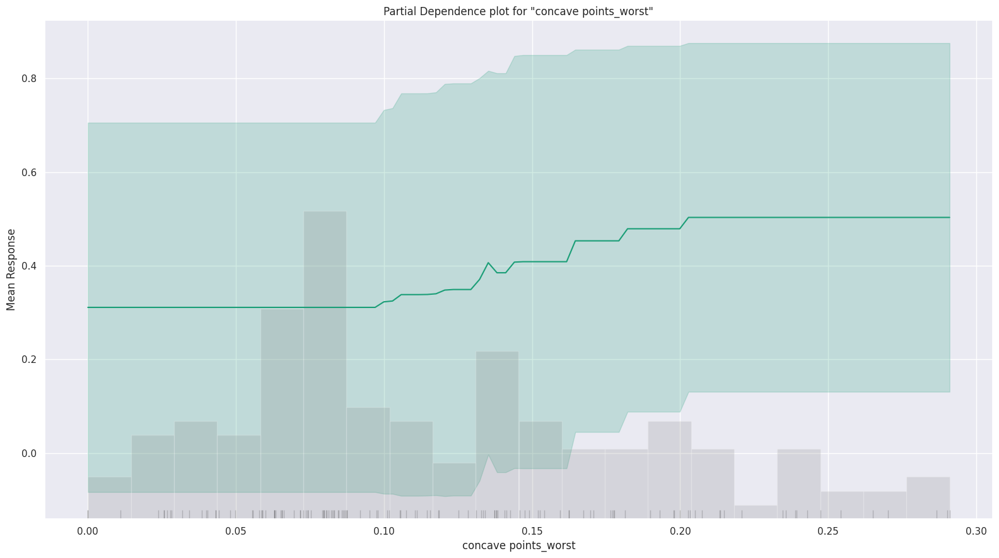

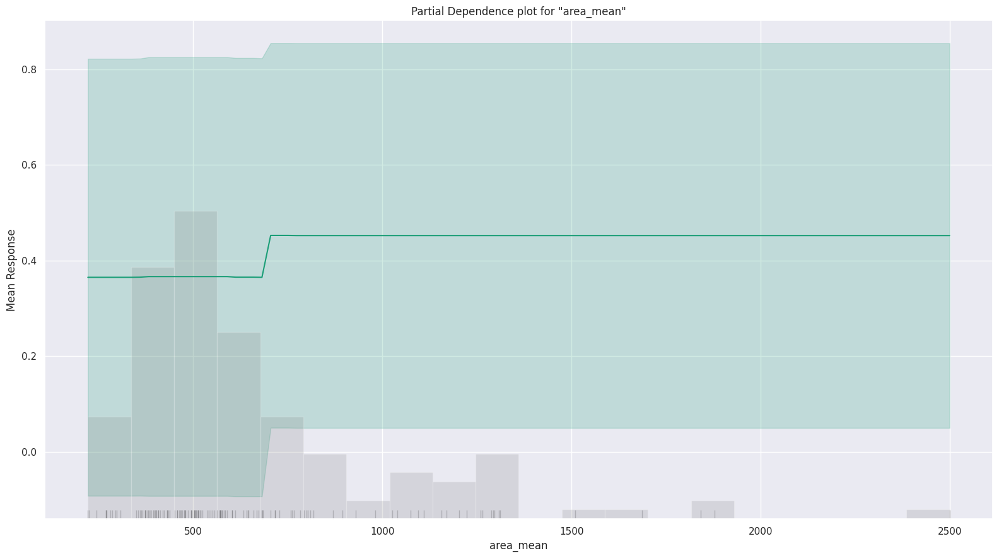

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

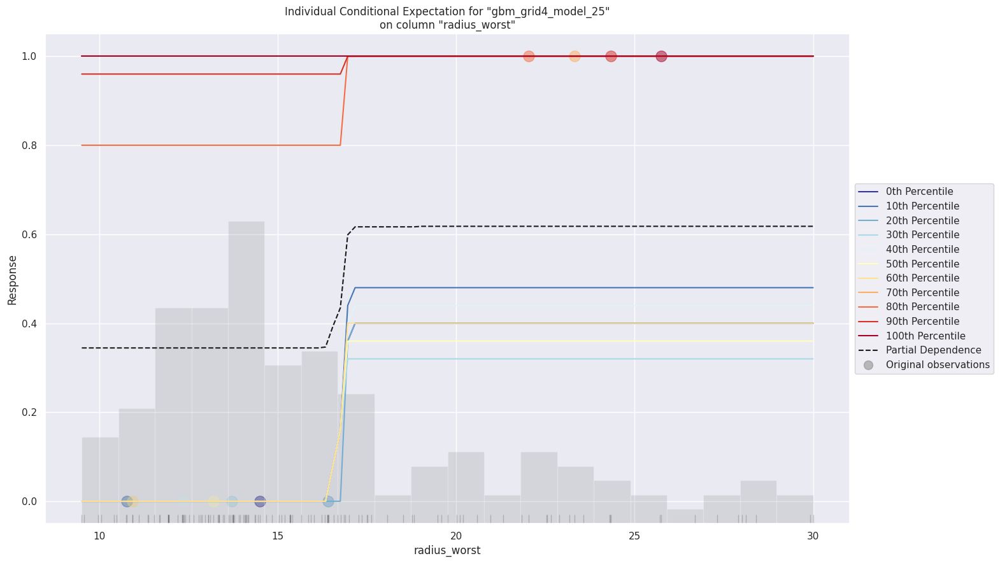

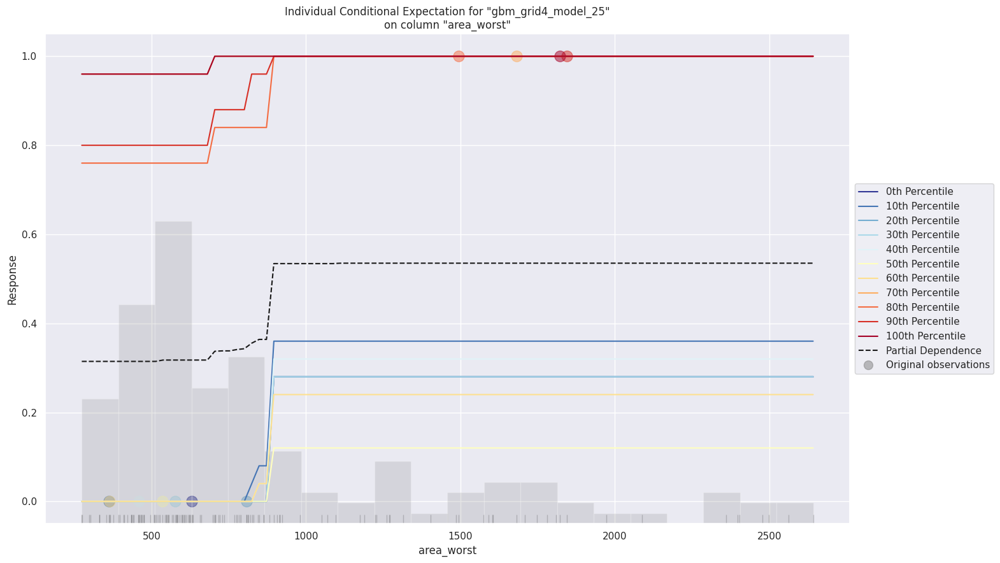

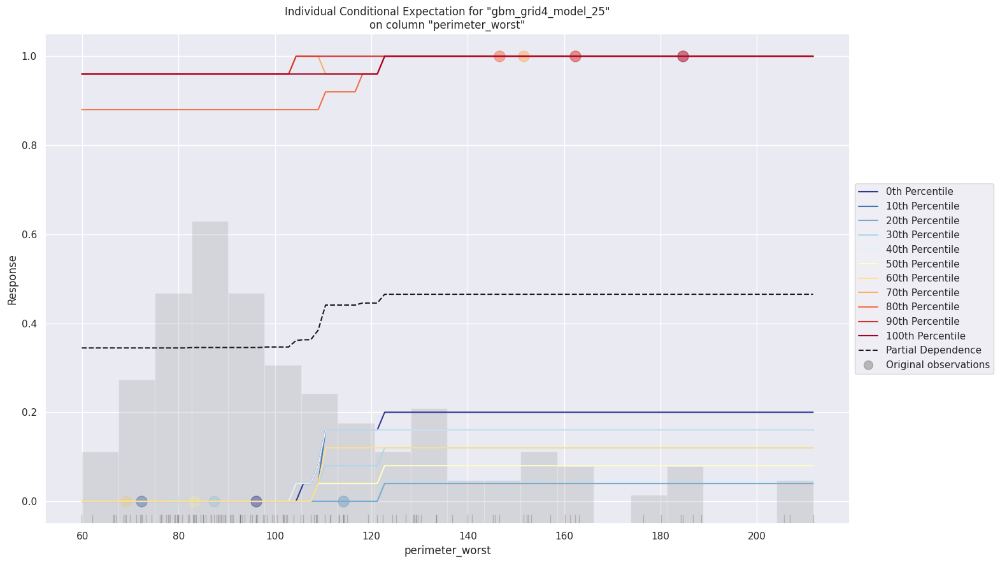

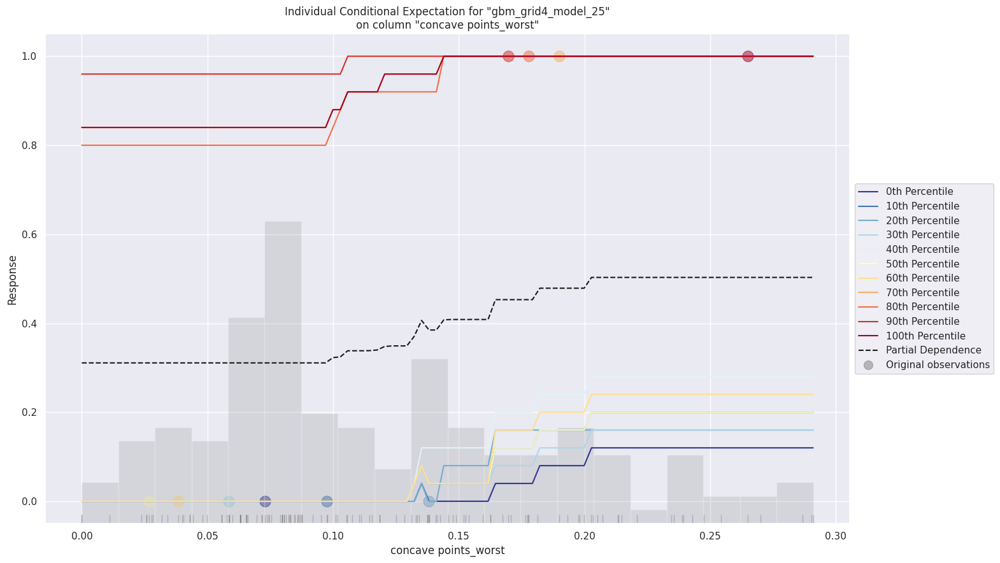

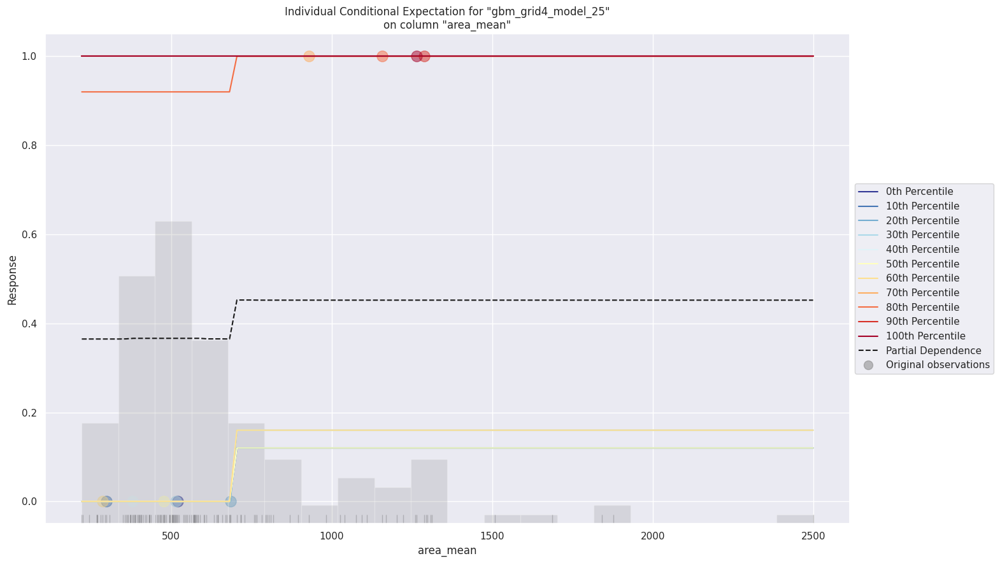

In [186]:
best_model.explain(autoML[1])  # AutoML Explainability

# **How are errors/residuals distributed and how interpretable is your model ?**

### **Residual Analysis**
Here, we can see the striped lines of residuals, which is an artifact of having an integer value as a response value, instead of a real value. It can also be observed from the above graph that residuals are normally distributed. Visuals signify that residuals don't have heteroscedasticity since the plot has striped lines and there is no cone shaped residual plot.

### **Variable Importance**
In the variable importance plot we can observe that the plot replicates the results which we got from the Linear Model and Tree-Based Model above.

### **SHAP Summary**
From the SHAP summary diagram, we can interpret a few conclusions -

1. All the features are listed as per their importance in making the prediction.
2. The position on the SHAP value axis indicates the impact the feature has on the prediction either positive or negative. That is, the more the data point is away from the 0.0 shap value - the more its impact is. The color of the dot represents (Red - High, Blue - Low) the impact of the value on the result.
3. From this visual, we can interpret that the chances of person getting disease increases as the concave_points_mean iincreases.
4. Let us analyze the distribution of SHAP values of this feature. As seen in the SHAP plot we can see that extreme values on both ends can have a significant effect in predicting the disease.
5. The advantage of SHAP analysis over normal feature importance is that we could visualize how the feature is affecting the target at different values. The standard methods tend to overestimate the importance of continuous or high-cardinality categorical variables.

### **Partial Dependence Plot (PDP)**
A partial dependence plot shows the marginal effect of a feature on the target(diagnosis in out dataset). It is achieved by keeping all other variables constant and changing the value of one variable to get its PDP.

### **ICE (Individual Conditional Expectation) Plot**

ICE plot is similar to what we did in the PDP plot, but the fundamental difference between the two methods is that the PDP plot focuses on the average effect of a feature and does not focus on a specific instance. ICE plot comes in rescue to address this drawback of the PDP plot where the outputs from all instances are considered instead of an average value.

Each line in an ICE plot represents the predicted value of the response variable for a single instance as the predictor variable changes. By looking at these lines together, you can get a sense of how the relationship between the predictor and response variables varies across different instances in the dataset.

As we can see in the ICE plot above the diagnosis parameter(target variable) of a few instances in data set(0th percentile instance) is constant first and decreases in this range while the target variable of a few instances doesn't change much(100th Percentile Instance).

Individual conditional expectation curves are even more intuitive to understand than partial dependence plots. One line represents the predictions for one instance if we vary the feature of interest.

### **Observations**
- The AutoML's best model with its Hyperparameter's tuned is the best model for this task as it has the highest accuracy of 100 % compared to the other models tested in this excercise.
- Also, this model is interpretible i.e. we can actually get to the root of what made this prediction to come to.


### **Learning Outcomes**

- The results obtained from the experiments showed promising predictive performance, with the models achieving high **Accuracy** and **Precision.**
- The complete lifecycle of a Data Science project right from data prepartion to hyperparameter tuning is what I gained from previous Assignments
- Majority of the time should be invested in data preparation i.e. cleaning the data, normalizing, feature selection, imputation   etc
- Feature importance analysis revealed that certain key features, such as ,radius_worst, perimeter_mean, were important in predicting **Breast Cancer Disease.**
- Model evaluation and comparison helped in identifying the best-performing model for **Breast Cancer Disease prediction**.

- Model Interpretation is the best takeaway from the series of these assignments. SHAP, LIME and PDP have made it easier to understand what made a model to predict a outcome.

In summary, this project demonstrated the potential of machine learning techniques in predicting **Breast Cancer Disease** and highlighted the importance of data exploration, preprocessing, and model evaluation in the prediction process.
The findings of this project may have implications in the early detection and management of **Breast Cancer Disease**, potentially leading to improved patient outcomes.





#  **Citations**

1.Many techniques used in this notebook have been adopted from the following github repositories

Owner - AI Skunkworks
Link - https://github.com/aiskunks/Skunks_Skool

Author name - Prof Nik Bear Brown
Link - https://github.com/nikbearbrown/

2.Automated Machine Learning with H20
Link - https://towardsdatascience.com/automated-machine-learning-with-h2o-258a2f3a203f

3.Explain Your Model with the SHAP Values
Link - https://medium.com/dataman-in-ai/explain-your-model-with-the-shap-values-bc36aac4de3d

4.Interpretability Methods in Machine Learning: A Brief Survey
Link- https://www.twosigma.com/articles/interpretability-methods-in-machine-learning-a-brief-survey/

# **Licensing**

**Copyright 2023 Payal Sanjay Nagaonkar**

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.